<a href="https://colab.research.google.com/github/jgodoy1992/Proyecto_mineria_de_datos/blob/master/Trabajo_final_MdD.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<img src="https://i.ibb.co/pRBQnM8/Logo-Duoc-UC-svg.png" width="500">

# EVALUACIÓN Nº3 - MINERÍA DE DATOS - DATASET WEATHERAUS.CSV

# I BUSINESS UNDERSTANDING

## 📖 *Contexto*

Australia en un país caracterizado por su diversidad climática y condiciones meteorológicas extremas como sequías, ciclones e inundaciones. El monitoreo y predicción de la lluvia es crucial para sectores como la agricultura, la gestión del agua, planificación urbana, prevención de desastres naturales y seguros. Anticipar eventos de lluvia permite a estas industrias minimizar pérdidas económicas, optimizar recursos y mejorar la toma de decisiones operativas

## ❗❗❗ *Objetivo Del proyecto*

Utilizar observaciones meteorológicas diarias para predecir la probabilidad de lluvia, estimar la cantidad esperada de precipitaciones y detectar condiciones propensas a eventos de riesgo por lluvia, apoyando así a sectores económicos y organismos de planificación.

Se trabajará con dos tipos de objetivos:

* Regresión: Estimar cuandos milímetros de lluvia caerán (Rainfall)
* Clasificación: Predecir si lloverá en el día actual (RainToday) o al día siguiente (RainTomorrow)

## ❌ *Problemas de negocio a resolver*

* ¿Qué condiciones meteorológicas indican una alta probabilidad de lluvia hoy?
* ¿Qué varaibles ayudan a predecir si lloverá mañana?
* ¿Qué factores influyen en la cantidad de lluvia registrada?
* ¿Se puede anticipar eventos de riesgo por lluvias intensas?

## ✍ *Objetivos de Minería de Datos*

* Construir modelos de regresión para estimar la cantidad de lluvia en milimetros.
* Construir modelos de clasificación para:
    * Identificar patrones en los datos que permitan saber si hubo lluvia hoy.
    * Predecir si lloverá al día siguiente.

## ✅ *Beneficios potenciales*

* Mejorar la planificación agrícola.
* Soporte en decisiones de mantenimiento y planificación urbana.
* Apoyo a compañías aseguradoras para evaluar riesgos.
* Alertas tempranas y protocolos de emergencia ante lluvias intensas.

## 🤔 *Supuestos iniciales*

* Los datos meteorológicos son representativos y han sido procesados correctamente por la Oficina de Meteorología.
* Variables como temperatura, humedad, presión, dirección y velocidad del viento, entre otras, contienen información suficiente para predecir eventos de lluvia.
* Se asume que la variable Rainfall puede ser tratada como medida cuantitativa para modelas eventos extremos.

## 🔜 *ATRIBUTOS DEL DATASET*

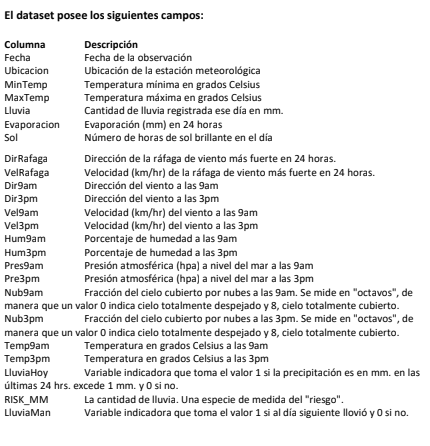

## 🎯 *VARIABLES A ANALIZAR*

* MODELOS DE REGRESION: "RISK_MM"

* MODELOS DE CLASIFICACIÓN: "RAINTOMORROW"

* MODELO DE CLUSTER: " "

# II DATA UNDERSTANDING

In [ ]:
!pip install cartopy

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.7/11.7 MB 28.1 MB/s eta 0:00:00


In [ ]:
!pip install imbalanced-learn

In [ ]:
# Importamos librerías a utilizar
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import math
import os
import time
import ipywidgets as widgets
from IPython.display import display
%matplotlib inline

from sklearn.utils import resample
from sklearn.model_selection import train_test_split, KFold, RandomizedSearchCV
from sklearn.preprocessing import MinMaxScaler, LabelEncoder
from sklearn.metrics import classification_report, roc_auc_score, roc_curve, auc,\
                            confusion_matrix, accuracy_score, precision_score, recall_score,\
                            f1_score, silhouette_score, davies_bouldin_score, mean_squared_error, r2_score
from sklearn.linear_model import LogisticRegression, LinearRegression
from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor
from sklearn.svm import LinearSVR
from sklearn.feature_selection import SelectKBest, mutual_info_classif, mutual_info_regression
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.ensemble import GradientBoostingClassifier, RandomForestRegressor, RandomForestClassifier
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.cluster import KMeans, MiniBatchKMeans
from sklearn.decomposition import PCA
from xgboost import XGBClassifier

import cartopy.crs as ccrs
import cartopy.feature as cfeature
from imblearn.over_sampling import SMOTE

from warnings import filterwarnings
filterwarnings("ignore")

## DATASET ➡ WeatherAus.CSV

In [ ]:
# Cargamos el dataset desde github

df = pd.read_csv('https://raw.githubusercontent.com/LucasOG7/weather.csv/refs/heads/main/weatherAUS.csv')

# Mostramos las primeras 5 filas del dataset para contextualizarnos
df.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RISK_MM,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,0.0,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,0.0,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,0.0,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,1.0,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,0.2,No


## 🧐 INFORMACIÓN GENERAL DE LOS DATOS

In [ ]:
# Información general de los datos
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 142193 entries, 0 to 142192
Data columns (total 24 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Date           142193 non-null  object 
 1   Location       142193 non-null  object 
 2   MinTemp        141556 non-null  float64
 3   MaxTemp        141871 non-null  float64
 4   Rainfall       140787 non-null  float64
 5   Evaporation    81350 non-null   float64
 6   Sunshine       74377 non-null   float64
 7   WindGustDir    132863 non-null  object 
 8   WindGustSpeed  132923 non-null  float64
 9   WindDir9am     132180 non-null  object 
 10  WindDir3pm     138415 non-null  object 
 11  WindSpeed9am   140845 non-null  float64
 12  WindSpeed3pm   139563 non-null  float64
 13  Humidity9am    140419 non-null  float64
 14  Humidity3pm    138583 non-null  float64
 15  Pressure9am    128179 non-null  float64
 16  Pressure3pm    128212 non-null  float64
 17  Cloud9am       88536 non-null

## ⬆ INTERPRETACIÓN

* Se puede observar que hay más datos numericos (17) que categóricos (6)
* Tambien todos los datos numéricos son de tipo float, no hay presencia de datos numéricos enteros o booleanos

## 📋 RESUMEN ESTADÍSTICO

In [ ]:
# Resumen estadístico para cada variable del dataset

for col in df:
    print(f"\n Resumen de: {col}")
    if df[col].dtype in ['int64', 'float64']:
        print(df[col].describe())
    else:
        print(df[col].value_counts(dropna=False))


 Resumen de: Date
Date
2017-06-23    49
2013-03-04    49
2014-04-13    49
2014-03-25    49
2017-05-18    49
              ..
2008-01-27     1
2008-01-28     1
2008-01-29     1
2008-01-30     1
2008-01-31     1
Name: count, Length: 3436, dtype: int64

 Resumen de: Location
Location
Canberra            3418
Sydney              3337
Perth               3193
Darwin              3192
Hobart              3188
Brisbane            3161
Adelaide            3090
Bendigo             3034
Townsville          3033
AliceSprings        3031
MountGambier        3030
Ballarat            3028
Launceston          3028
Albany              3016
Albury              3011
MelbourneAirport    3009
PerthAirport        3009
Mildura             3007
SydneyAirport       3005
Nuriootpa           3002
Sale                3000
Watsonia            2999
Tuggeranong         2998
Portland            2996
Woomera             2990
Cairns              2988
Cobar               2988
Wollongong          2983
GoldCoast        

## ⬆ INTERPRETACIÓN


🌡 *Temperaturas* (MinTemp) (MaxTemp)

* Se puede observar que la temperatura promedio en australia ronda entre 12ºC y 23ºC
* Se tiene un rango amplio entre temperaturas máximas y mínimas
* Mínimos muy bajos y Máximos muy altos lo cual podriamos revisar más adelante (outlayers)


🏃‍♂️ *Precipitaciones* (RainFall)

* Aunque la precipitación promedio del país es de 2.35 mm la mediana es de 0 mm lo cual puede indicar que no llueve siempre

* Marca un máximo de 371 mm de precipitación lo que probablemente sean datos outliers

🍃 *Velocidad del viento* (WindGustSpeed)

* Se observa una media de 39km/hr y un maximo de 135 km/hr lo que nuevamente se puede tratar de outliers

☁ *RainToday y RainTomorrow*

* Datos considerablemente desbalanceados lo cual puede ser perjuducial para los modelos de predicción

* Presencia de demasiados nulos tanto de RainToday y otras variables

📍 *Ubicación* (Location)

* El lugar con más datos de australia es Canberra (3418), mientras que el lugar con menos datos es Uluru (1521)

* Fuerte variabilidad de datos en distintas regiones


## 📝 ¿Qué podemos concluir?

* Presencia de outliers importantes en variables como RainFall, WinsGustSpeed, lo cual trataremos más adelante

* Aplicar codificación binaria para algunas variables categóricas para luego modelar de manera correcta

* Sesgo en las variable RainFall ya que cuenta con muchos datos en 0 o en otras palabras, tiene muchos dias con 0 mm

* El dataset muestra variedad climática y regional lo cual puede ser bueno para modelos que puedan predecir la lluvia, viento, precipitaciones, etc.


## ⛅ SEGMENTACIÓN ESTACIONES

In [ ]:
# Segmentamos las estaciones con date para luego mostrar sus distribuciones por estación
df['Date'] = pd.to_datetime(df['Date'])

df["Estacion"] = pd.cut(
    df["Date"].dt.month,
    bins = [0,3,6,9,12],
    labels = ["Verano", "Otoño", "Invierno", "Primavera"],
    right=True
)

df["Estacion"]=df["Estacion"].astype('object')

## 📍 DISTRIBUCIÓN DE VARIABLES SEGÚN ESTACIÓN Y LOCACIÓN

In [ ]:
def display_data_hist(location, estacion, metrica) -> None:
    plt.figure(figsize = (10,6))

    filtered_data = df[(df["Location"] == location) & (df["Estacion"] == estacion)]

    if metrica == "MinMaxTemp":
        sns.histplot(filtered_data["MinTemp"], bins = 30,kde = True, color = "skyblue", label = "MinTemp", ax = plt.gca())
        sns.histplot(filtered_data["MaxTemp"], bins = 30,kde = True, color = "salmon", label = "MaxTemp", ax = plt.gca())

    else:
        sns.histplot(filtered_data[metrica], bins = 30,kde = True, color = "skyblue", label = metrica, ax = plt.gca())

    plt.title(f"Distribución de {metrica} de {location} en {estacion}")
    plt.xlabel(metrica)
    plt.ylabel("Frecuencia")
    plt.legend()
    plt.show()

locations = df["Location"].unique()
estaciones = df["Estacion"].unique()

col_metricas = df.select_dtypes("number").columns.difference(["MinTemp", "MaxTemp"]).tolist()

metricas = ["MinMaxTemp"] + col_metricas

location_dropdown_hist = widgets.Dropdown(
    options = locations,
    value = locations[0],
    description = "Selecciona un lugar:",
    disabled = False,
)

estacion_dropdown_hist = widgets.Dropdown(
    options = estaciones,
    value = estaciones[0],
    description = "Selecciona una estación:",
    disabled = False,
)

metrica_dropdown_hist = widgets.Dropdown(
    options = metricas,
    value = metricas[0],
    description = "Selecciona una métrica:",
    disabled = False,
)

interactive_plot_metricas = widgets.interactive(
    display_data_hist,
    location = location_dropdown_hist,
    estacion = estacion_dropdown_hist,
    metrica = metrica_dropdown_hist
)

display(interactive_plot_metricas)

interactive(children=(Dropdown(description='Selecciona un lugar:', options=('Albury', 'BadgerysCreek', 'Cobar'…

## 🌨 PROMEDIO PRECIPITACIONES POR ESTACIÓN

In [ ]:
#Visualización de precipitaciones

def update_plot_rainfall(estacion):
    lluvia_por_lugar = df[df["Estacion"] == estacion].groupby("Location")["Rainfall"].mean().reset_index().sort_values("Rainfall", ascending = False)

    plt.figure(figsize = (16,9))

    sns.barplot(x = "Rainfall", y = "Location", data = lluvia_por_lugar, palette = "viridis")

    plt.title(f"Promedio de temperaturas por lugar para {estacion}")

    plt.xlabel("Precipitaciones en mm")

    plt.show()

estacion_dropdown_rain = widgets.Dropdown(
    options = ["Verano", "Otoño", "Invierno", "Primavera"],
    value = "Verano",
    description = "Selecciona una estación:",
    disabled = False,
)

interactive_plot_estacion = widgets.interactive(
    update_plot_rainfall,
    estacion = estacion_dropdown_rain
)

display(interactive_plot_estacion)

interactive(children=(Dropdown(description='Selecciona una estación:', options=('Verano', 'Otoño', 'Invierno',…

## ⬆ INTERPRETACIÓN

* Se muestra la cantidad promedio de lluvia por cada lugar donde se realizaron las mediciones. En él, se muestra que existe una amplia diferencia entre los lugares con mayor cantidad de lluvia y aquellos con pocas precipitaciones, donde el ratio entre el lugar con menos precipitaciones con el lugar con mayor precipitaciones es aproximadamente 1:6.

* Desde luego, el gráfico anterior no explica completamente por qué se da este fenómeno. Es aquí donde entra el sigueinte mapa. En él, se puede ver dónde se registran las medidas de lluvia. Cada globo además de mostrar el lugar donde se registra la cantidad de lluvia, muestra su magnitud de esta medida. Se puede notar que los lugares que registran mayores cantidades de lluvia son aquellos que se ubican en la costa este y norte del territorio australiano. Esto puede deberse a que en estos lugares el clima es de caracter tropical o subtropical lo que trae cantidades considerables de precipitaciones. También se ve que los menores valores se registran hacia el interior, donde predomina el clima desértico, por lo que resulta lógico que existan menos precipitaciones.

## 🗾 VISTA PRECIPITACIONES DE CIUDADES VÍA MAPA POR ESTACIONES

In [ ]:
#Visualización vía mapa

cities = pd.read_csv('https://gist.githubusercontent.com/rlvaugh/f5d08b0ef8fae288e4bbcfcf5af9bf89/raw/66d2df035908f596cd4d21c35bede05130e7fe25/au_cities_2020')

cities = cities[["city", "lat", "lng"]]

cities = cities.rename(columns = {"city":"Location"})

cities['Location'] = cities['Location'].str.replace(' ','')

def rainfall_map_plot(estacion):
    lluvia_por_lugar = df[df["Estacion"] == estacion].groupby("Location")["Rainfall"].mean().reset_index().sort_values("Rainfall", ascending = False)

    df_merge_rainfall_location = pd.merge(lluvia_por_lugar, cities, on = "Location", how = "inner")

    fig = plt.figure(figsize=(20,20))
    ax = plt.axes(projection = ccrs.PlateCarree())

    ax.set_extent([110, 155, -45, -10])
    ax.coastlines()
    ax.add_feature(cfeature.BORDERS)
    ax.add_feature(cfeature.LAND, facecolor='lightgray')
    ax.add_feature(cfeature.OCEAN, facecolor='lightblue')
    ax.add_feature(cfeature.RIVERS)
    ax.add_feature(cfeature.LAKES, alpha=0.5)

    rainfall = df_merge_rainfall_location["Rainfall"]
    size_scale = 250
    size = rainfall * size_scale

    scatter = ax.scatter(
        df_merge_rainfall_location["lng"],
        df_merge_rainfall_location["lat"],
        s = size,
        c = rainfall,
        cmap = "viridis",
        alpha = 0.6,
        edgecolors = "black",
        transform = ccrs.PlateCarree()
    )

    for _, row in df_merge_rainfall_location.iterrows():
        ax.text(row["lng"] +0.5, row["lat"], row["Location"], fontsize = 10,transform = ccrs.PlateCarree())

    cbar = plt.colorbar(scatter, ax=ax, shrink=0.5, orientation='vertical', label='Promedio precipitaciones (mm)')

    plt.title("Mapa del Promedio de precipitaciones por ciudad")

    plt.show()

estacion_map_dropdown = widgets.Dropdown(
    options = ["Verano", "Otoño", "Invierno", "Primavera"],
    value = "Verano",
    description = "Selecciona una estación:",
    disabled = False,
)

interactive_plot_map = widgets.interactive(
    rainfall_map_plot,
    estacion = estacion_map_dropdown
)

display(interactive_plot_map)

interactive(children=(Dropdown(description='Selecciona una estación:', options=('Verano', 'Otoño', 'Invierno',…

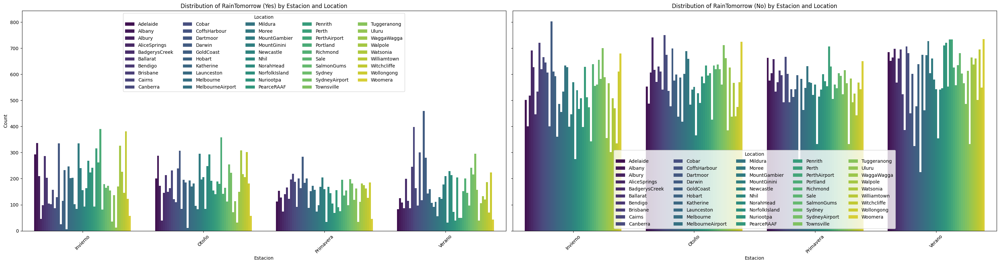

In [ ]:
# Get the count data
#rain_today_counts = df.groupby(["Estacion", "Location"])["RainTomorrow"].count().reset_index(name='Count')

# Filter for RainToday == 'Yes'
rain_today_yes = df[df['RainTomorrow'] == "Yes"].groupby(["Estacion", "Location"])["RainTomorrow"].count().reset_index(name='Count')

# Filter for RainToday == 'No'
rain_today_no = df[df['RainTomorrow'] == "No"].groupby(["Estacion", "Location"])["RainTomorrow"].count().reset_index(name='Count')

# Create a figure with two subplots
fig, axes = plt.subplots(1, 2, figsize=(30, 8), sharey=True) # sharey=True ensures same y-axis scale

# Plot RainToday == 'Yes' on the first subplot
sns.barplot(x="Estacion", y="Count", hue="Location", data=rain_today_yes, palette='viridis', ax=axes[0])
axes[0].set_title('Distribution of RainTomorrow (Yes) by Estacion and Location')
axes[0].set_xlabel('Estacion')
axes[0].set_ylabel('Count')
axes[0].tick_params(axis='x', rotation=45)
axes[0].legend(title='Location', loc='upper center', ncol = 5)

# Plot RainToday == 'No' on the second subplot
sns.barplot(x="Estacion", y="Count", hue="Location", data=rain_today_no, palette='viridis', ax=axes[1])
axes[1].set_title('Distribution of RainTomorrow (No) by Estacion and Location')
axes[1].set_xlabel('Estacion')
axes[1].set_ylabel('Count')
axes[1].tick_params(axis='x', rotation=45)
axes[1].legend(title='Location', loc='lower center', ncol = 5)

# Adjust layout
plt.tight_layout()
plt.show()

## ⬆ INTERPRETACIÓN

* Resulta obvio que existe un desbalanceo en la variable objetivo de RainTomorrow. En el gráfico se puede ver este fenómeno, y resulta natural evaluar una estrategia para balancear esta etiqueta en el dataset (SMOTE es un buen candidato).

## 👀 Visualizamos la presencia de nulos

In [ ]:
# Visualizamos si hay presencia de nulos en cada variable del dataset
print(" 😫 Cantidad total de nulos: ", df.isnull().sum().sum())
df.isnull().sum().sort_values(ascending = True)

 😫 Cantidad total de nulos:  316559


,0
Date,0
Location,0
RainTomorrow,0
RISK_MM,0
Estacion,0
MaxTemp,322
MinTemp,637
Temp9am,904
WindSpeed9am,1348
Rainfall,1406


## 👀 Visualizamos la presencia de outliers

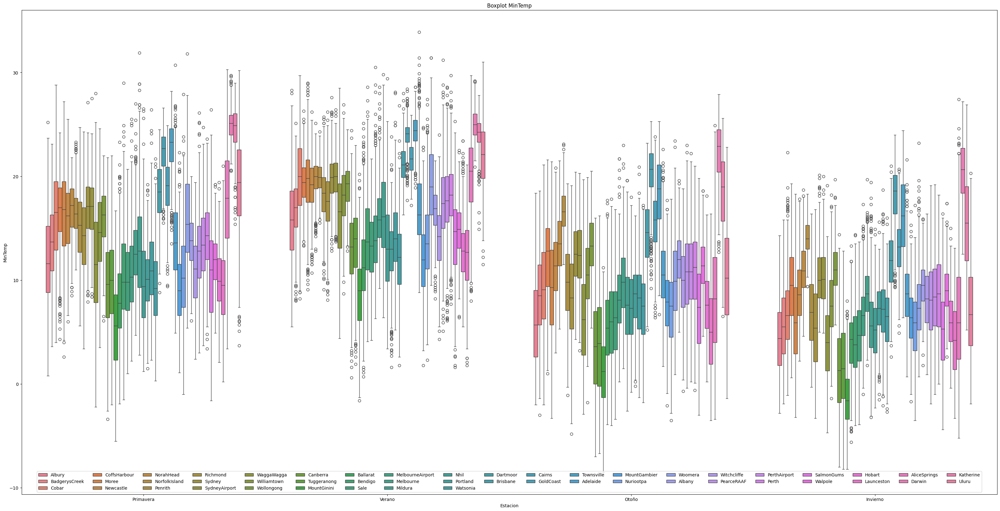

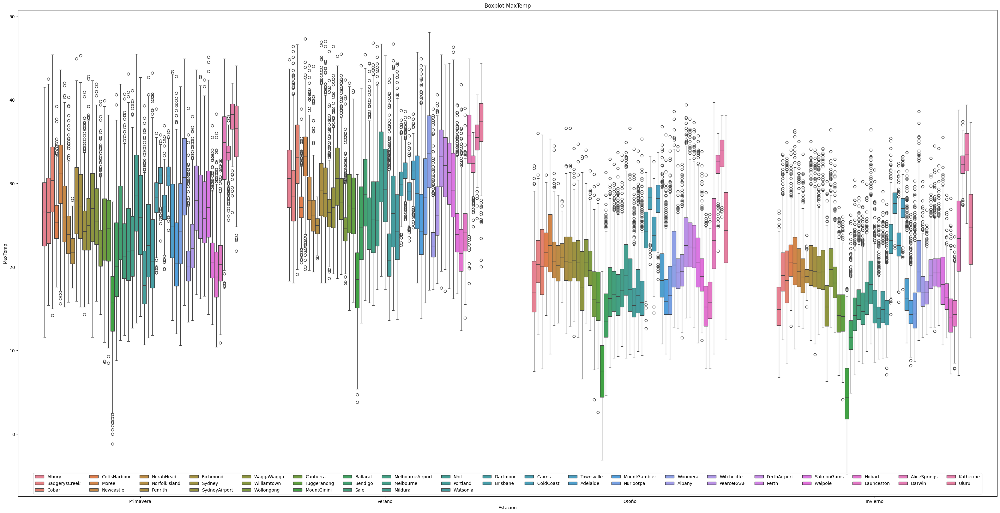

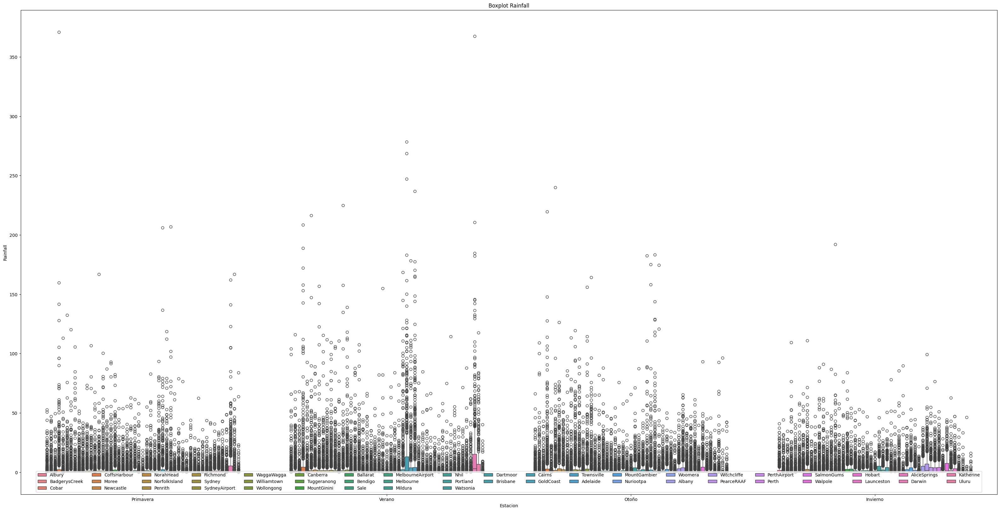

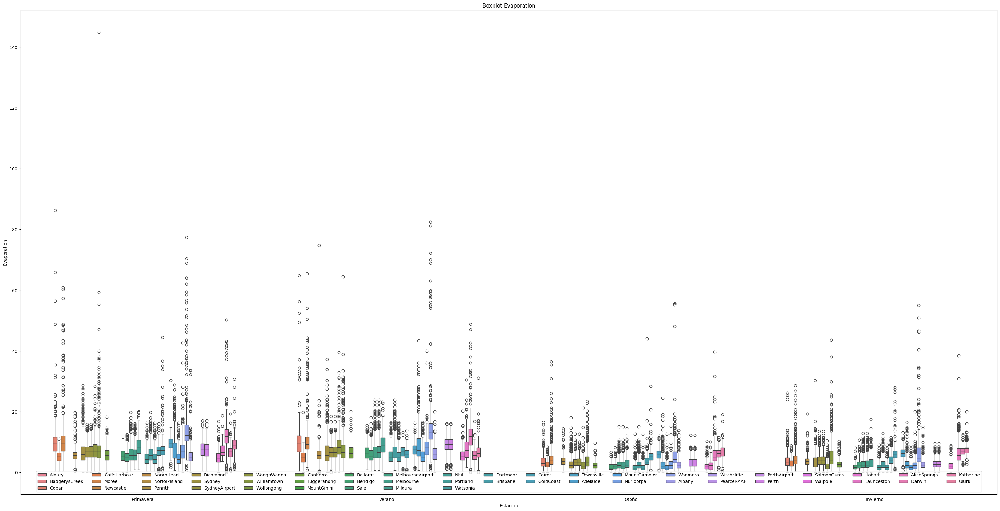

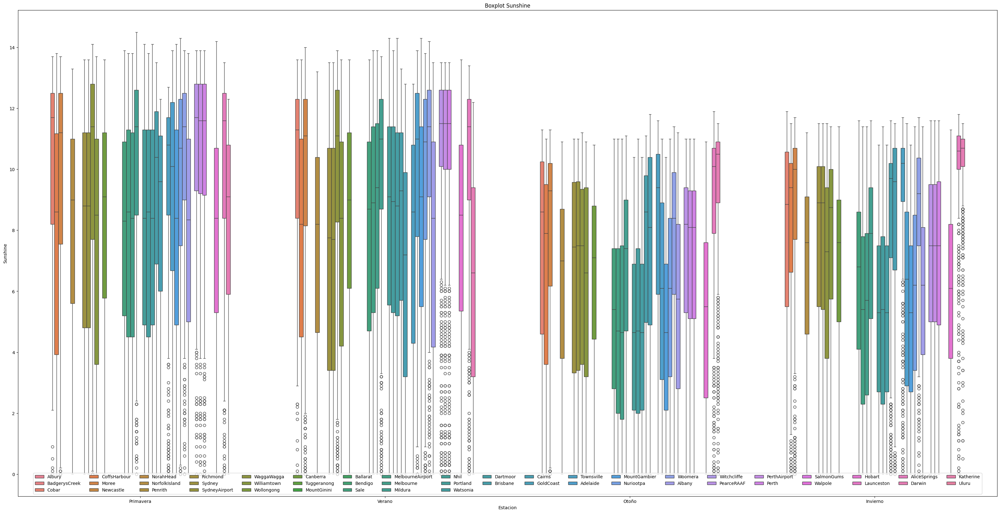

...

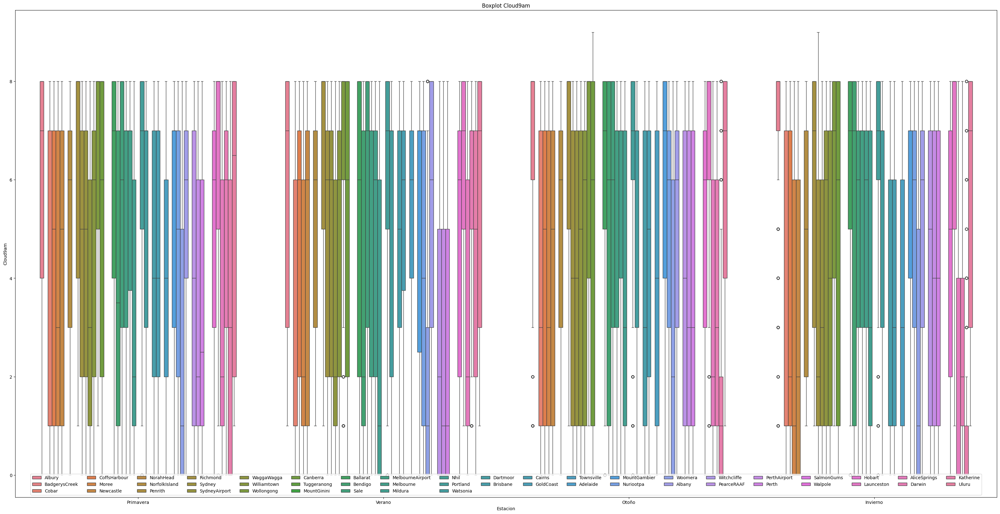

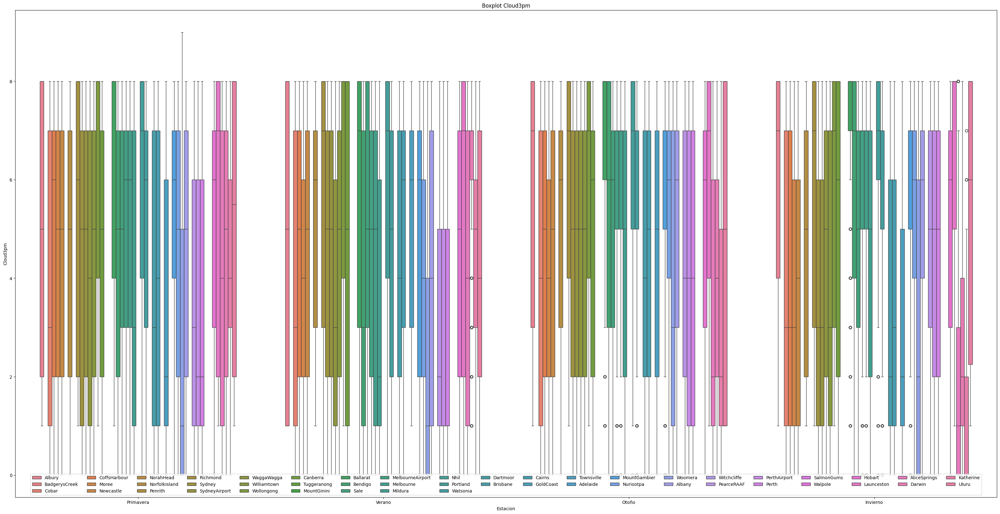

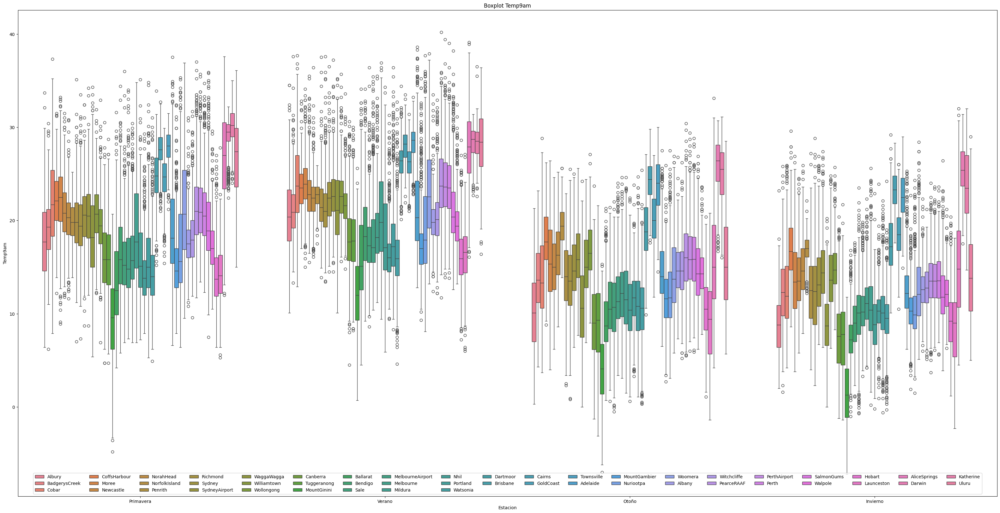

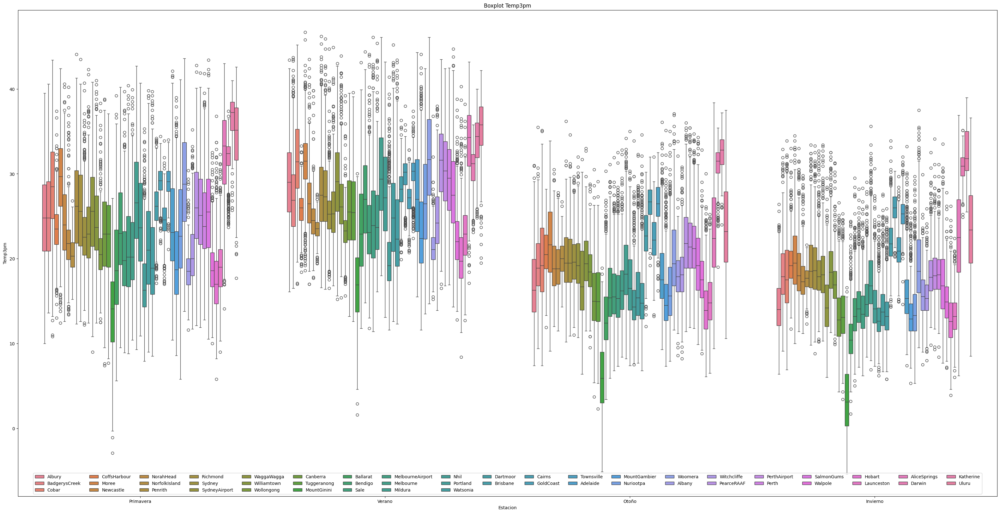

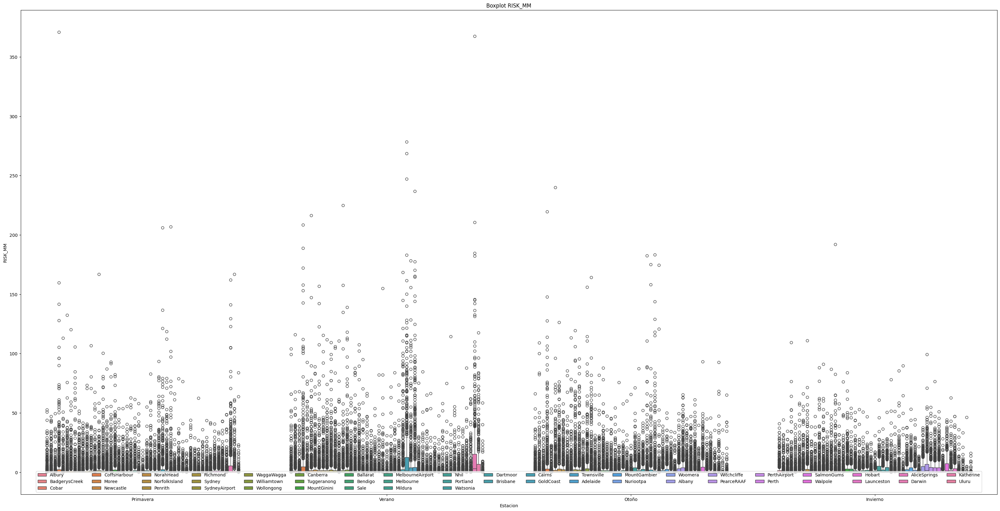

In [ ]:
group = ["Estacion", "Location"]

numeric_df = df.select_dtypes("number")
n_cols = numeric_df.columns.tolist()


for col in n_cols:

    plt.figure(figsize = (40,20))
    ax = sns.boxplot(x = "Estacion", y = col, hue = "Location", data = df)
    ax.set_title(f"Boxplot {col}")
    ax.legend(loc = "lower center", ncol = 20)
    plt.show()

## ⬆ OUTLIERS

* Se observa que para cada variable existen outliers, salvo algunas excepciones, tales como Humidity3pm, Cloud9am, Cloud3pm. En el siguiente gráfico es posible observar los outliers segmentados por estación del año y lugar en donde se toman las mediciones. Con esta información se tomará la decisión de cómo tratar los outliers

# III DATA PREPARATION

In [ ]:
# Creamos un dataframe donde se incluyan solamente las variables de tipo "float64"
numerical_df = df.select_dtypes(include="float64")

## 🧹 TRATAMIENTO DE NULOS - VARIABLES NUMÉRICAS


* Se imputan los valores nulos con la mediana correspondiente a su segmento (Estación y Location). Si no existe mediana local, se imputa la mediana global del dataset

In [ ]:
def input_nan_num(df:pd.DataFrame, group:list) -> None:
    cols = df.drop(group, axis = 1).select_dtypes('number')

    for col in cols:

        if df[col].isnull().sum() > 0:
            global_median = df[col].median()

            def fill_func(x):
                med = x.median()
                if pd.isna(med):
                    return x.fillna(global_median)
                return x.fillna(med)

            df[col] = df.groupby(group)[col].transform(fill_func)

## 🧹 TRATAMIENTO DE NULOS - VARIABLES CATEGÓRICAS

* Se imputan los valores nulos con la moda de acuerdo a su segmento (Estación y Location). Si no encuentra moda local, imputa conla moda global del dataset.


In [ ]:
def input_nan_cat(df:pd.DataFrame, group:list) -> None:
    cols = df.drop(group, axis = 1).select_dtypes("object")

    for col in cols:
        if df[col].isnull().sum() > 0:

            global_mode = df[col].mode()[0] if not df[col].mode().empty else "Unkown"

            def  fill_func(x):
                if x.mode().empty:
                    return x.fillna(global_mode)
                return x.fillna(x.mode()[0])

            df[col] = df.groupby(group)[col].transform(fill_func)

## 👀 VISUALIZAMOS NULOS TRATADOS

In [ ]:
# Invocamos funciones y mostramos
input_nan_num(df, ["Estacion", "Location"])
input_nan_cat(df, ["Estacion", "Location"])
df.isnull().sum()

,0
Date,0
Location,0
MinTemp,0
MaxTemp,0
Rainfall,0
Evaporation,0
Sunshine,0
WindGustDir,0
WindGustSpeed,0
WindDir9am,0


## ⬆ INTERPRETACIÓN

* Se observa que los datos nulos han sido tratados con una mediana global entre todas las variables numéricas, lo que hace más preciso nuestros datos para luego cuando entrenemos modelos nos entregue información más precisa

## 🧹 TRATAMIENTO DE OUTLIERS

In [ ]:
# Función para imputar outliers utilizando el rango intercuartil
def is_outlier(s) -> bool:
    Q1 = s.quantile(0.25)
    Q3 = s.quantile(0.75)
    IQR = Q3 - Q1

    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    return (s < lower_bound) | (s > upper_bound)

def replace_outliers(df:pd.DataFrame, attrs:list) -> pd.DataFrame:
    for attr in attrs:
        s = df[attr]
        outliers = is_outlier(s)
        median = s[~outliers].median()
        df.loc[outliers, attr] = median
    return df

## 👀 VISUALIZAMOS OUTLIERS TRATADOS

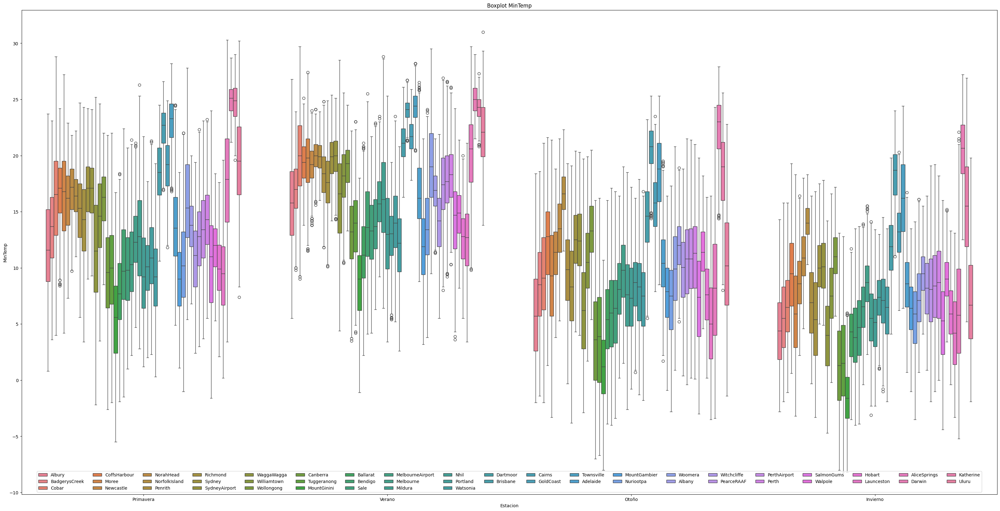

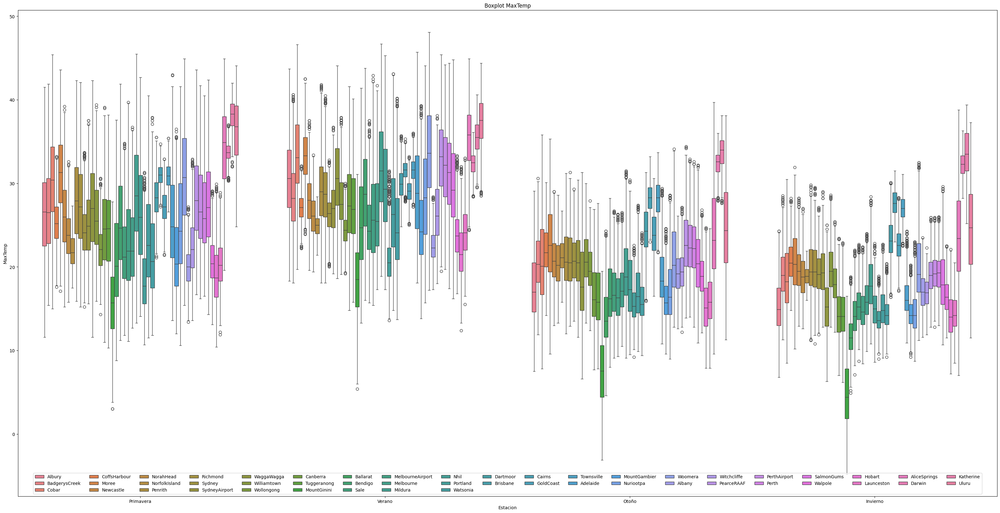

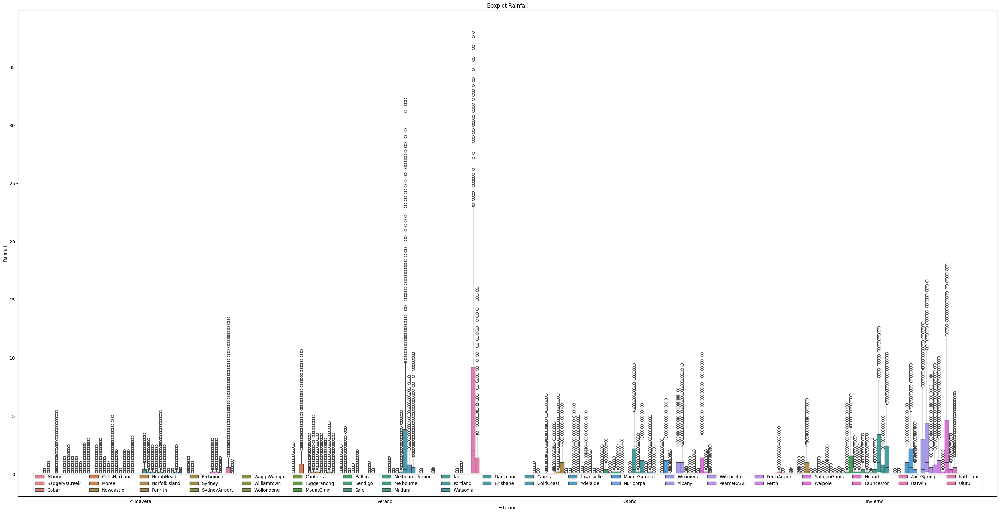

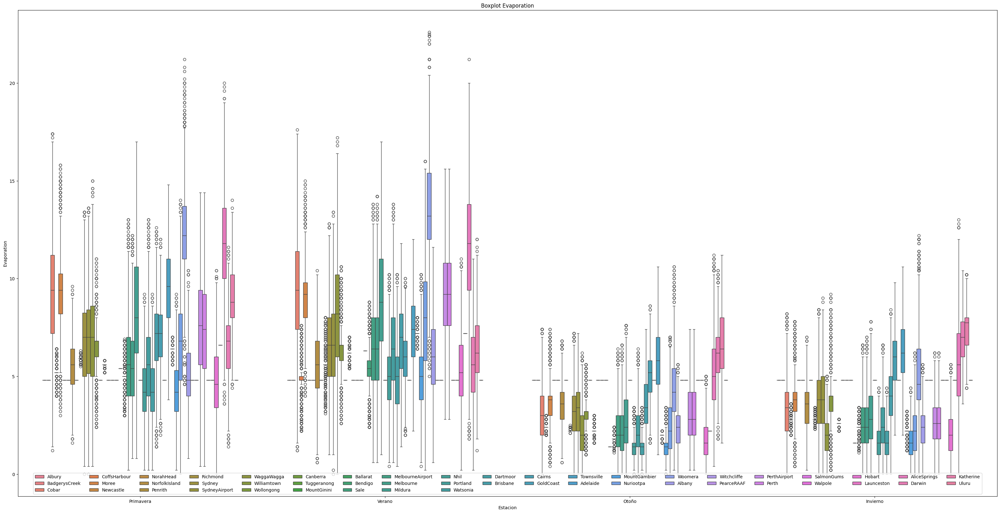

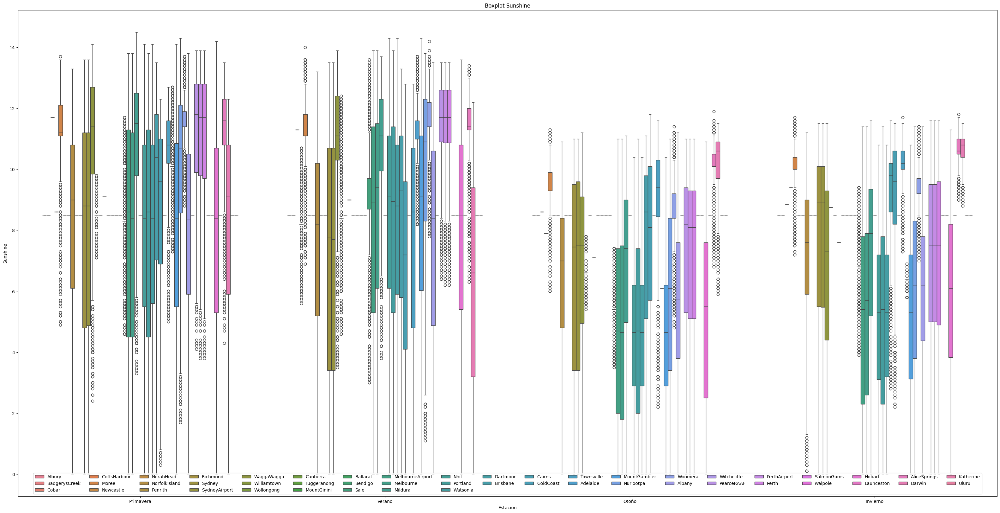

...

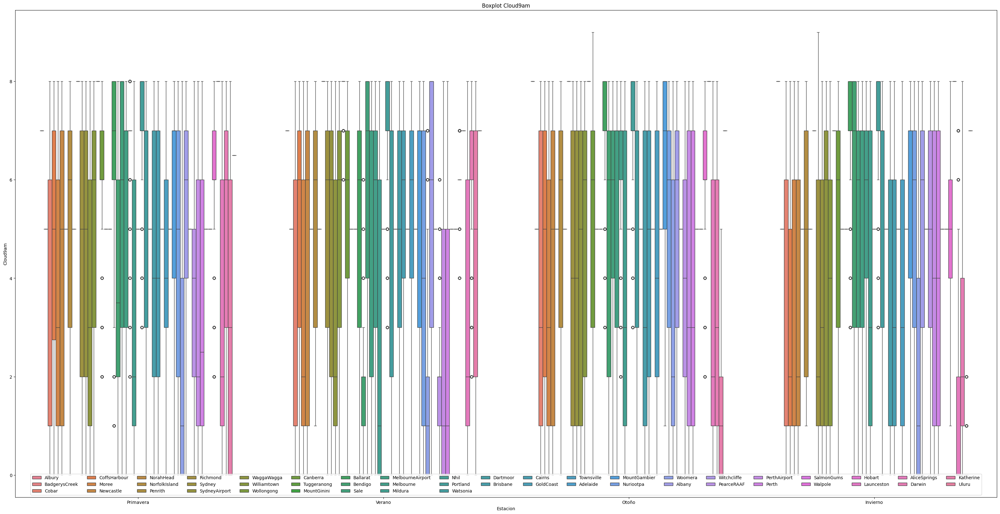

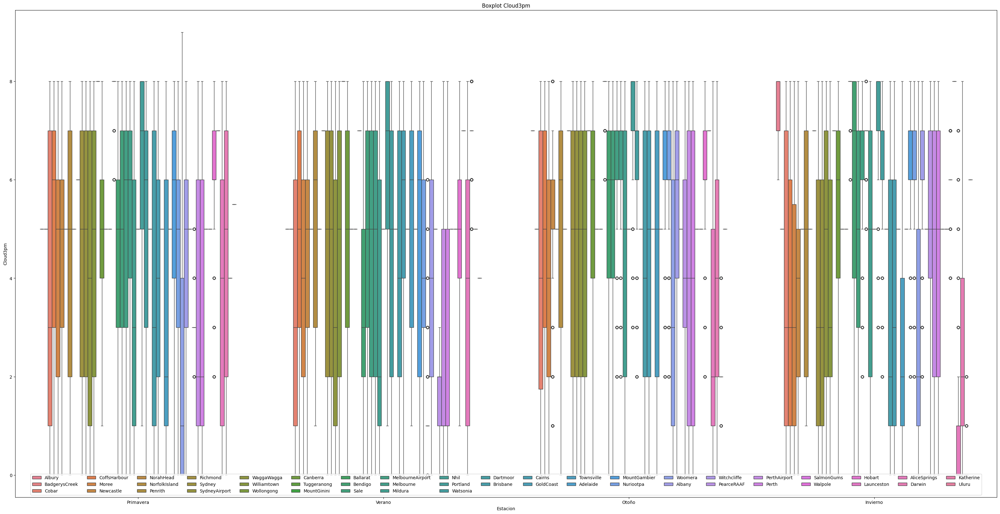

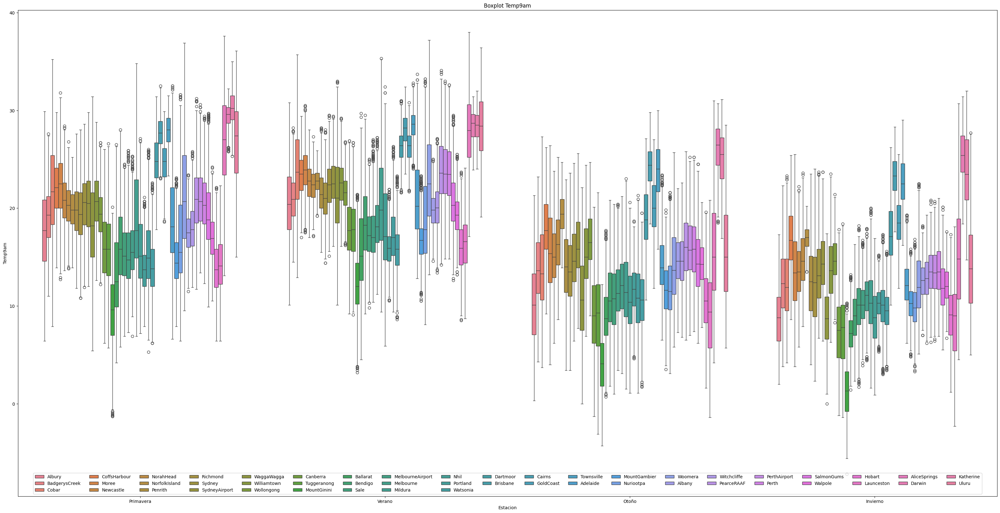

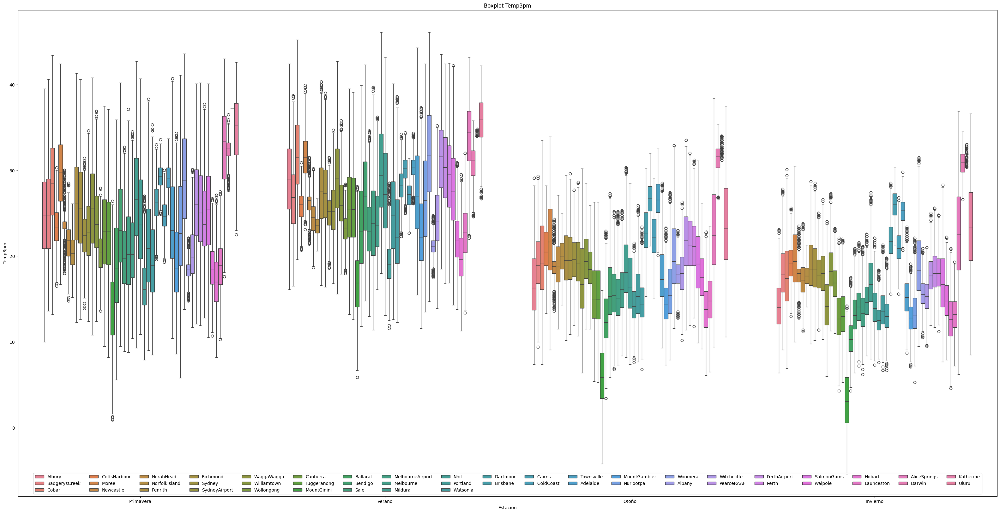

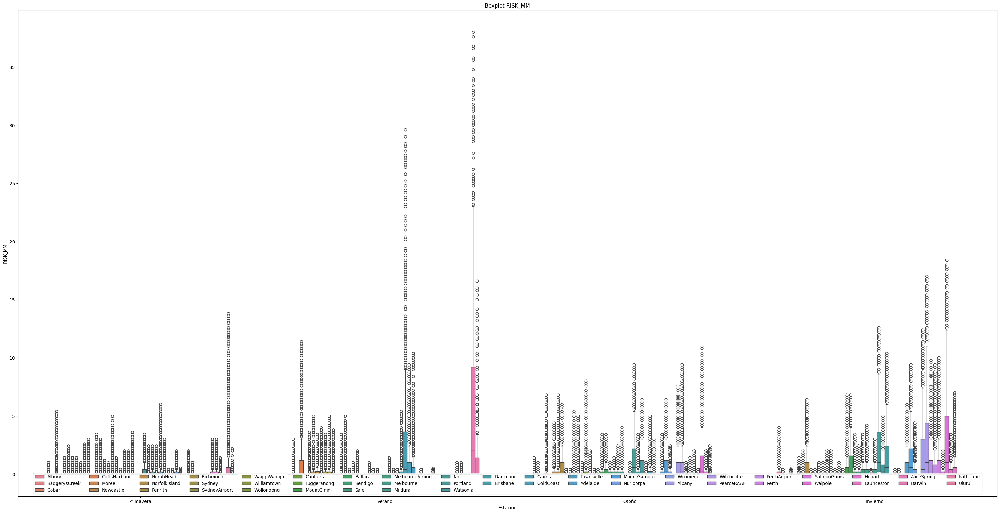

In [ ]:
groups = ["Estacion", "Location"]

numerical_df = df.select_dtypes("number")

num_cols = numerical_df.columns.tolist()

# for col in num_cols:
#     df = df.reset_index(drop = True)
#     df = replace_outliers(df, groups, col)

df = df.groupby(groups, group_keys = False).apply(lambda x: replace_outliers(x, num_cols))

for col in num_cols:

    plt.figure(figsize = (40,20))
    ax = sns.boxplot(x = "Estacion", y = col, hue = "Location", data = df)
    ax.set_title(f"Boxplot {col}")
    ax.legend(loc = "lower center", ncol = 20)
    plt.show()

## ⬆ INTERPRETACIÓN

* Otra problemática con la data es cómo se tratan los outliers. En este caso la mejor estrategia vendría a realizar un reemplazo del valor por la mediana de su segmento. Si bien este proceso puede ser iterativo hasta alcanzar un dataset sin outliers, con una iteración del proceso es suficiente, pues los outliers restantes son tolerables para los modelos


# IV: MODELING

In [ ]:
#Columna de correlación

def corr_mat(df, target):
    corr = df.corr(numeric_only=True)[target]

    corr = corr.sort_values(ascending = False)

    plt.figure(figsize=(10, 8))
    sns.barplot(x=corr.values, y=corr.index, palette="viridis")
    plt.title(f"Correlacion con {target}")
    plt.xlabel("Coef. correlación")
    plt.ylabel("Features")
    plt.grid(axis='x', linestyle='--')
    plt.show()

In [ ]:
# Estas funciones implementan la técnica de encoding por target de variable tanto categórica como numérica.
# Básicamente toma la variable objetivo y saca un promedio de acuerdo a los atributos asociados a esta variable
# luego codifica los atributos según esa metrica

def target_encoding_oof(df: pd.DataFrame, target: str, cat_col: str, n_splits: int = 5, smoothing: int = 10) -> pd.Series:
    df_copy = df.copy()
    global_mean = df[target].mean()
    encoded = pd.Series(index = df.index, dtype = "float")
    kf = KFold(n_splits = n_splits, shuffle = True, random_state = 42)

    for train_idx, val_idx in kf.split(df):
        train_val = df.iloc[train_idx]
        val = df.iloc[val_idx]
        agg = train_val.groupby(cat_col)[target].agg(["count", "mean"])
        counts = agg["count"]
        means = agg["mean"]
        smooth = (counts * means + smoothing * global_mean)/(counts + smoothing)
        val_map = val[cat_col].map(smooth)
        encoded.iloc[val_idx] = val_map.fillna(global_mean)

    return encoded

def encode_test_column(train: pd.DataFrame, test: pd.DataFrame, cat_col:str, target:str, smoothing:int = 10) -> pd.Series:
    global_mean = train[target].mean()
    agg = train.groupby(cat_col)[target].agg(["mean", "count"])
    counts = agg["count"]
    means = agg["mean"]
    smooth = (counts * means + smoothing * global_mean)/(counts + smoothing)
    return test[cat_col].map(smooth).fillna(global_mean)

### ⬆ INTERPRETACIÓN

* Encodificación de datos categoricos utilizando target encoding. El target encoding consiste en convertir variables categóricas en números basada en cómo esas categorías se relacionan con la variable objetivo (target). Este proceso busca reducir la dimensionalidad (contrario a one hot encoding), y no introduce jerarquía en variables nominales (a diferencia de LabelEncoding). Es especialmente útil para variables de alta cardinalidad, como la variable location en nuestro caso.

## 🧮 MODELOS DE REGRESIÓN

In [ ]:
df_reg = df.drop("Date", axis = 1).copy()

cat_cols = df_reg.select_dtypes("object").columns.tolist()

target = "RISK_MM"

train_df, test_df = train_test_split(df_reg, test_size = 0.2, random_state = 42)

for col in cat_cols:
    train_df[f"{col}_encoded"] = target_encoding_oof(train_df, target, col)
    test_df[f"{col}_encoded"] = encode_test_column(train_df, test_df, col, target)

cat_encoded_cols = [f"{col}_encoded" for col in cat_cols]
numeric_cols = df_reg.select_dtypes("number").columns.difference([target]).tolist()

X_train_reg = train_df[cat_encoded_cols + numeric_cols]
X_test_reg = test_df[cat_encoded_cols + numeric_cols]
y_train_reg = train_df[target]
y_test_reg = test_df[target]

### 📏 SE NORMALIZAN LOS DATOS

In [ ]:
scaler = MinMaxScaler()

X_train_scaled = scaler.fit_transform(X_train_reg)
X_test_scaled = scaler.transform(X_test_reg)

In [ ]:
X_train_scaled = pd.DataFrame(X_train_scaled, columns = X_train_reg.columns)
X_test_scaled = pd.DataFrame(X_test_scaled, columns = X_test_reg.columns)

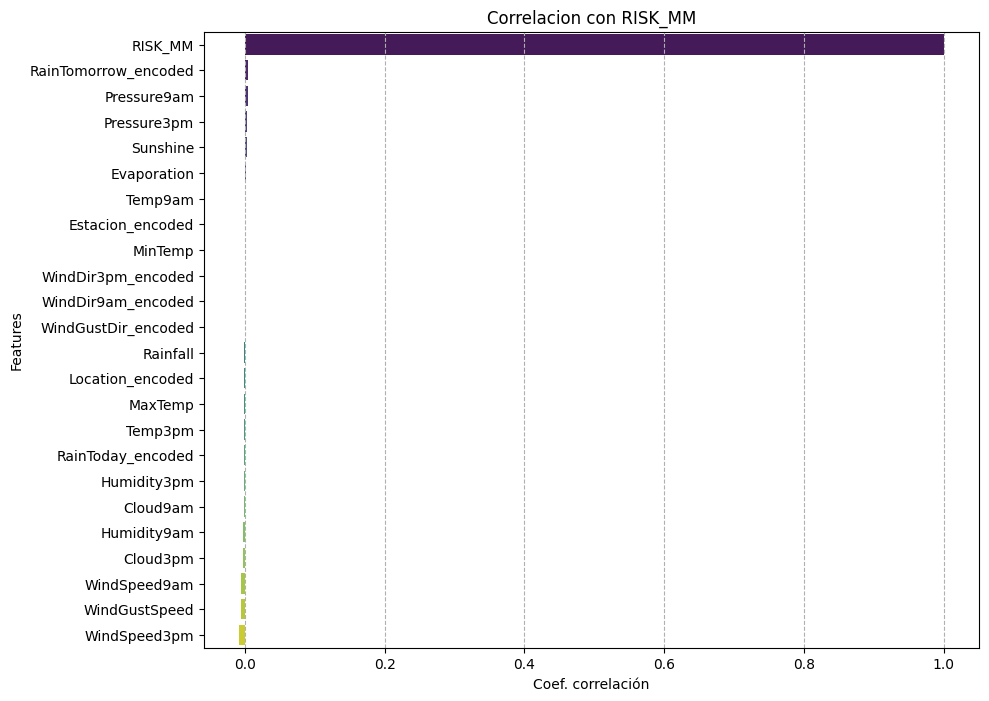

In [ ]:
X_r = X_train_scaled.copy()
X_r["RISK_MM"] = y_train_reg

corr_mat(X_r, "RISK_MM")

### 🤖 TRANSFORMER

In [ ]:
class CombinedSelectRegressionRFSKB(BaseEstimator,TransformerMixin):
    def __init__(self, rfk = 7, skb = 7):
        self.rfk = rfk
        self.skb = skb
        self.selected_features_  = []

    def fit(self, X: pd.DataFrame, y: pd.Series):

        #selector RandomForestRegressor

        rfr = RandomForestRegressor(n_estimators = 100, random_state = 42)
        rfr.fit(X,y)
        rfr_importances = rfr.feature_importances_
        rfr_indices = np.argsort(rfr_importances)[::-1][:self.rfk]
        rfr_selected = X.columns[rfr_indices]

        #selector SelectKBets

        selector = SelectKBest(mutual_info_regression, k = self.skb)
        selector.fit(X,y)
        skb_selected = X.columns[selector.get_support(indices = True)]

        self.selected_features_ = list(set(rfr_selected).union(set(skb_selected)))

        return self

    def transform(self, X:pd.DataFrame):
        return X[self.selected_features_]

In [ ]:
selector = CombinedSelectRegressionRFSKB(rfk = 10, skb = 10)

X_selected_reg = selector.fit_transform(X_train_scaled, y_train_reg)
X_test_selected_reg = selector.transform(X_test_scaled)

In [ ]:
class RegressionModelTrainer:
    def __init__(self):

        self.results = []
        self.results_df = pd.DataFrame()


    def train_model(self, X_train,X_test, y_train, y_test,models, sample_train = False,param_grids = None, test_size=0.2, random_state=42, cv=5, scoring = "r2"):

        if sample_train:
            X_train,_,y_train,_ = train_test_split(X_train,y_train, train_size=0.3 ,random_state=42)

        for name, model in models.items():

            if param_grids and name in param_grids:
                # Realiza la búsqueda aleatoria de hiperparámetros
                random_search = RandomizedSearchCV(model, param_grids[name], cv = cv, scoring = scoring, n_jobs = -1)
                random_search.fit(X_train, y_train)
                best_model = random_search.best_estimator_
                best_params = random_search.best_params_
                best_score = random_search.best_score_
                y_pred = best_model.predict(X_test)

                # Calcula las métricas de evaluación
                mse = mean_squared_error(y_test, y_pred)
                r2 = r2_score(y_test, y_pred)

                if best_model:

                    self.results.append(
                        {
                            "Model": name,
                            "MSE": mse,
                            "R2": r2,
                            "Best Params": best_params,
                            "Best Score": best_score
                        }
                    )
            else:
                # Entrena el modelo sin ajuste de hiperparámetros
                model.fit(X_train, y_train)
                y_pred = model.predict(X_test)
                best_model = model

                # Calcula las métricas de evaluación
                mse = mean_squared_error(y_test, y_pred)
                r2 = r2_score(y_test, y_pred)

                self.results.append(
                    {
                        "Model": name,
                        "MSE": mse,
                        "R2": r2
                    }
                )



        self.results_df = pd.DataFrame(self.results)
        # return self.results_df # Devolver el DataFrame de resultados (comentado)

    def print_results(self):
        # Imprime la tabla de resultados con formato
        cm = sns.light_palette("green", as_cmap = True)
        display(self.results_df.sort_values(by = ["R2", "MSE"], ascending = False).style.background_gradient(cmap = cm))

    def plot_results(self):
        # Grafica los resultados de MSE y R2
        results_melted = self.results_df.melt(id_vars = "Model", var_name = "Metric", value_name = "Score")

        models = results_melted["Model"].unique()
        x = np.arange(len(models))

        width = 0.4

        fig, ax1 = plt.subplots(figsize = (10,6))

        # Barra para MSE
        mse_scores = results_melted[results_melted["Metric"] == "MSE"]["Score"].values
        bars1 = ax1.bar(x-width/2, mse_scores, width, label = "MSE", color = "skyblue")
        ax1.set_ylabel("MSE", color = "skyblue")
        ax1.tick_params(axis = "y", labelcolor = "skyblue")


        ax2 = ax1.twinx()
        # Barra para R2
        r2_scores = results_melted[results_melted["Metric"] == "R2"]["Score"].values
        bars2 = ax2.bar(x+width/2, r2_scores, width, label = "R2", color = "salmon")
        ax2.set_ylabel("R2", color = "salmon")
        ax2.tick_params(axis = "y", labelcolor = "salmon")

        ax1.set_xticks(x)
        ax1.set_xticklabels(models)
        ax1.set_xlabel("Modelo") # Traducido
        ax1.set_title("Comparación de MSE y R2 para cada modelo") # Traducido

        ax1.legend([bars1,bars2],  ["MSE", "R2"], loc = "upper left")

        r2_scores = results_melted[results_melted["Metric"] == "R2"]

        plt.tight_layout()
        plt.show()

### 🕵️‍♀️ ENTRENAMIENTO DE MODELOS SELECCIONADOS

In [ ]:
models_reg = {
    "Lineal Regression": LinearRegression(),
    "SVM Regressor": LinearSVR(random_state = 42),
    "Decision Tree Regressor": DecisionTreeRegressor(random_state = 42)
}

trainer_reg = RegressionModelTrainer()
trainer_reg.train_model(X_selected_reg, X_test_selected_reg, y_train_reg, y_test_reg, models_reg)

### 👀 VISUALIZAMOS LOS RESULTADOS DE LOS MODELOS ENTRENADOS

In [ ]:
trainer_reg.print_results()

,Model,MSE,R2
0,Lineal Regression,1.635862,0.254298
1,SVM Regressor,2.164608,0.013272
2,Decision Tree Regressor,2.334188,-0.064031


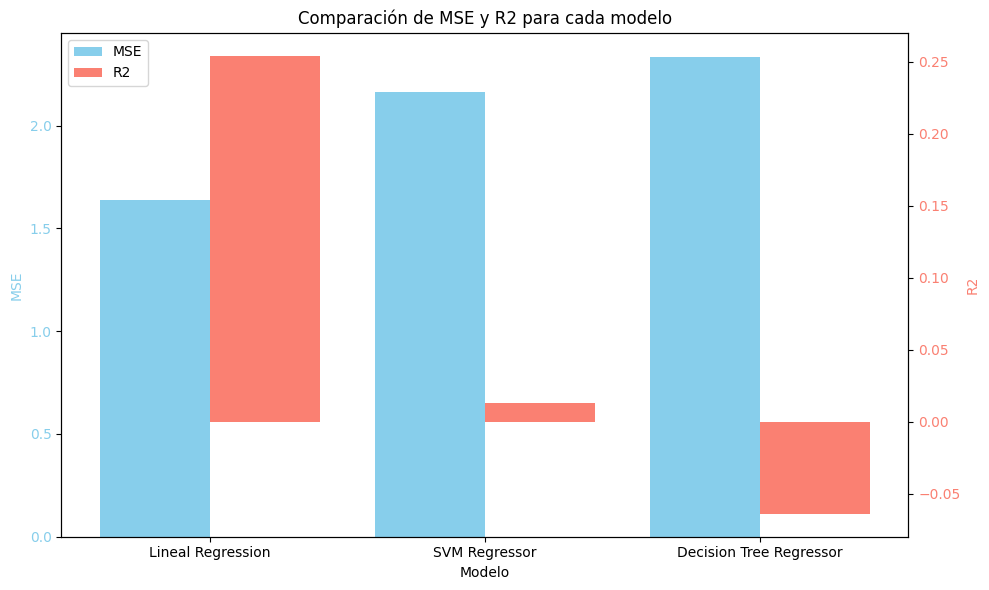

In [ ]:
trainer_reg.plot_results()

### ⬆ INTERPRETACIÓN


De la tabla y gráfico anterior se puede destacar las siguientes conclusiones:

* Regresión Lineal: Es el modelo que presenta mejor rendimiento, sin embargo cuenta con un R2 de 0.25 lo que significa que explica el 25% de la variación en la variable objetivo. Aún cuando no es un valor estelar, es significativamente mayor a los otros dos modelos, y su error cuadrático medio es el menor de los tres

* SVM Regressor: presenta un R2 demasiado bajo (0.01 aprox.), lo que significa que el modelo apenas captura relaciones y predicciones. A esto se le suma que tiene un MSE elevado.

* Decision Tree Regressor: Consta de un R2 negativo lo que significa que el modelo tiene un rendimiento pobre. Esto es, que es peor que simplemente predecir el promedio de la variable objetivo. Además, es el modelo que tiene mayor MSE, lo que conduce a pensar que es el modelo con peor rendimiento.

Las posibles razones de estos resultados pobres, puede ser las siguientes:

* Los atributos (features) pueden no explicar bien la variable ojectivo, o esta última presenta ruido o presenta una naturaleza no lineal.

¿Qué se puede hacer para mejorar para el futuro? Se recomienda reprocesar los datos y evaluar modelos ensamblados, tales como Random Forest Regressor.

## 🎎 MODELOS DE CLASIFICACIÓN

In [ ]:
################
#              #
#  IMPORTANTE  #
#              #
################

# La transformación que ocurre en esta celda es SOLO para la variable categórica
# RainTomorrow. Para cualquier otra variable categórica es solo cambiar los nombres.
# se debe realizar el mismo proceso pero adaptarlo para la variable numerica de regresión

df_classif = df.drop("Date", axis = 1).copy()

df_classif["RainTomorrow"] = df_classif["RainTomorrow"].map({"Yes":1, "No":0})

cat_cols = df_classif.select_dtypes("object").columns.tolist()

target = "RainTomorrow"

train_df, test_df = train_test_split(df_classif, test_size = 0.2, stratify =df_classif["RainTomorrow"] , random_state = 42)

for col in cat_cols:
    train_df[f"{col}_encoded"] = target_encoding_oof(train_df, target, col)
    test_df[f"{col}_encoded"] = encode_test_column(train_df, test_df, col, target)

cat_encoded_cols = [f"{col}_encoded" for col in cat_cols]
numeric_cols = df_classif.select_dtypes("number").columns.difference(["RainTomorrow"]).tolist()

X_train = train_df[cat_encoded_cols + numeric_cols]
X_test = test_df[cat_encoded_cols + numeric_cols]
y_train = train_df["RainTomorrow"]
y_test = test_df["RainTomorrow"]

### 📏 SE NORMALIZAN LOS DATOS

In [ ]:
scaler = MinMaxScaler()

X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

### ⚖ SE BALANCEAN LOS REGISTROS DEL SET DE ENTRENAMIENTO, DE ACUERDO A LA VARIABLE OBJETIVO

In [ ]:
smote = SMOTE(random_state = 42)

X_resampled_classif, y_resampled_classif= smote.fit_resample(X_train_scaled, y_train)

In [ ]:
X_resampled_classif = pd.DataFrame(X_resampled_classif, columns = X_train.columns)
X_test_scaled_classif = pd.DataFrame(X_test_scaled, columns = X_test.columns)

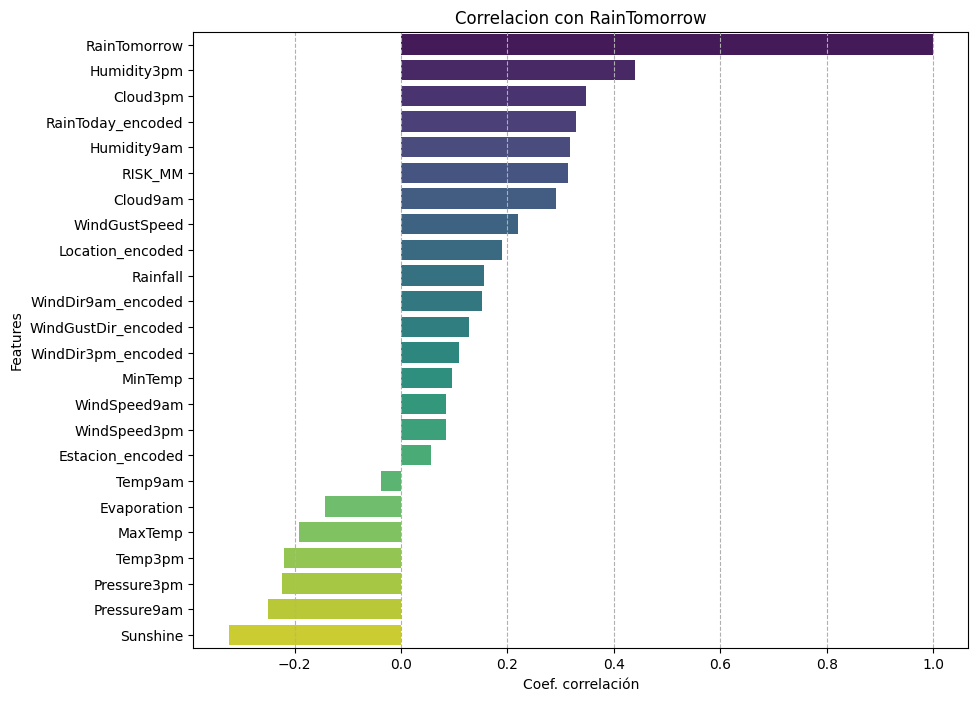

In [ ]:
X_r = X_resampled_classif.copy()
X_r["RainTomorrow"] = y_resampled_classif

corr_mat(X_r, "RainTomorrow")

In [ ]:
# Dimensiones de X_train_scaled
print("Dimensiones de X_train_scaled:", X_train_scaled.shape)

# Dimensiones de X_test_scaled
print("Dimensiones de X_test_scaled:", X_test_scaled.shape)

Dimensiones de X_train_scaled: (113754, 23)
Dimensiones de X_test_scaled: (28439, 23)


### 🤖 TRANSFORMER

### ⬆ USO DE TRANSFORMER

* Mediante el uso de un transformador se seleccionan el set de mejores k atributos para realizar la clasificación.

In [ ]:
class CombinedSelectClassificationRFSKB(BaseEstimator,TransformerMixin):
    def __init__(self, rfk = 7, skb = 7):
        self.rfk = rfk
        self.skb = skb
        self.selected_features_  = []

    def fit(self, X: pd.DataFrame, y: pd.Series):

        #selector RandomForestClassifier

        rfr = RandomForestClassifier(n_estimators = 100, random_state = 42)
        rfr.fit(X,y)
        rfr_importances = rfr.feature_importances_
        rfr_indices = np.argsort(rfr_importances)[::-1][:self.rfk]
        rfr_selected = X.columns[rfr_indices]

        #selector SelectKBets

        selector = SelectKBest(mutual_info_classif, k = self.skb)
        selector.fit(X,y)
        skb_selected = X.columns[selector.get_support(indices = True)]

        self.selected_features_ = list(set(rfr_selected).union(set(skb_selected)))

        return self

    def transform(self, X:pd.DataFrame):
        return X[self.selected_features_]

In [ ]:
# selected_features = list(set(list(rfc_selected) + list(kbest_selected)))
# X_resampled = X_resampled[selected_features]
# X_test_scaled = X_test_scaled[selected_features]

selector = CombinedSelectClassificationRFSKB(rfk = 12, skb = 12)

X_selected_classif = selector.fit_transform(X_resampled_classif, y_resampled_classif)
X_test_selected_classif = selector.transform(X_test_scaled_classif)

In [ ]:
class ClassificationModelTrainer:
    def __init__(self):
        self.results = []
        self.conf_mat = {}
        self.roc_values = {}
        self.i = 0
        self.results_df = pd.DataFrame()
        self._num_cols = 3
        self._num_rows = 0

        self._len_cols = 0

    def trainer(self, X_train, y_train, X_test, y_test, models, sample_train = False,param_grids = None, cv = 5, scoring = ["accuracy", "precision", "recall", "f1", "roc_auc"]):
        self._num_rows = int(np.ceil(len(models) / self._num_cols))

        self._len_cols = len(models)

        if sample_train:
            X_train,_,y_train,_ = train_test_split(X_train,y_train, train_size=0.3,stratify=y_train ,random_state=42)


        for name, model  in models.items():

            if param_grids and name in param_grids:
                #grid_search = GridSearchCV(model, param_grids[name], cv = cv, scoring = scoring, refit = "roc_auc", n_jobs = -1)
                # grid_search.fit(X_train, y_train)
                # best_model = grid_search.best_estimator_
                # best_params = grid_search.best_params_
                # best_score = grid_search.best_score_

                random_search = RandomizedSearchCV(model, param_distributions=param_grids[name], cv = cv, n_iter = 5, scoring = scoring, refit = "roc_auc", n_jobs = 2 )
                random_search.fit(X_train, y_train)
                best_model = random_search.best_estimator_
                best_params = random_search.best_params_
                best_score = random_search.best_score_

                if best_params:

                    y_pred = best_model.predict(X_test)
                    y_scores = best_model.predict_proba(X_test)[:,1]
                    accuracy = accuracy_score(y_test, y_pred)
                    precision = precision_score(y_test, y_pred)
                    recall = recall_score(y_test, y_pred)
                    f1 = f1_score(y_test, y_pred)
                    roc = roc_auc_score(y_test, y_scores)

                    self.conf_mat[self.i] = confusion_matrix(y_test, y_pred)
                    self.roc_values[self.i] = (y_test,y_scores)

                    self.results.append({
                        "Model": name,
                        "Best Params": best_params,
                        "Best Score": best_score,
                        "Accuracy": accuracy,
                        "Precision": precision,
                        "Recall": recall,
                        "F1": f1,
                        "ROC": roc
                    })

            else:

                model.fit(X_train, y_train)
                y_pred = model.predict(X_test)
                y_scores = model.predict_proba(X_test)[:,1]
                accuracy = accuracy_score(y_test, y_pred)
                precision = precision_score(y_test, y_pred)
                recall = recall_score(y_test, y_pred)
                f1 = f1_score(y_test, y_pred)
                roc = roc_auc_score(y_test, y_scores)

                self.conf_mat[self.i] = confusion_matrix(y_test, y_pred)
                self.roc_values[self.i] = (y_test,y_scores)

                self.results.append({
                    "Model": name,
                    "Accuracy": accuracy,
                    "Precision": precision,
                    "Recall": recall,
                    "F1": f1,
                    "ROC": roc
                })

            self.i += 1

        self.results_df = pd.DataFrame(self.results)

        #return self.results_df

    def print_results(self):
        cm = sns.light_palette("green", as_cmap=True)
        display(self.results_df.sort_values(by  = "Precision", ascending = False).style.background_gradient(cmap=cm))

    def print_corr_mat(self):

            current_models = len(self.results_df)
            self._num_rows = int(np.ceil(current_models / self._num_cols))
            self._len_cols = current_models

            idxs = self.results_df.sort_values(by = "Precision", ascending=False).index
            fig, axes = plt.subplots(self._num_rows, self._num_cols, figsize=(20, 8))
            axes = axes.flatten()

            for i, id in enumerate(idxs):
                ax = axes[i]
                sns.heatmap(self.conf_mat[i], annot=True, cmap='Blues', ax=ax)
                ax.set_title(self.results_df.loc[id, 'Model'])
                ax.set_xlabel("Actual")
                ax.set_ylabel("Predicción")

            for j in range(self._len_cols, len(axes)):
                fig.delaxes(axes[j])

            plt.tight_layout()
            plt.show()

    def print_roc_values(self):

        current_models = len(self.results_df)
        self._num_rows = int(np.ceil(current_models / self._num_cols))
        self._len_cols = current_models

        idxs = self.results_df.sort_values(by = "Precision", ascending=False).index
        plt.figure(figsize=(15,self._num_rows * 5))

        for i, id in enumerate(idxs):
            ax = plt.subplot(self._num_rows, self._num_cols,i+1)
            y_test, y_scores = self.roc_values[id]
            fpr, tpr, thresholds = roc_curve(y_test, y_scores)
            plt.plot(fpr, tpr, label='ROC curve (area = %0.4f)' % auc(fpr, tpr))
            plt.plot([0, 1], [0, 1], 'k--')
            plt.legend(loc = "lower right")

            ax.set_title(f"{self.results_df.iloc[id,0]}")
            ax.set_xlabel("False Positive Rate")
            ax.set_ylabel("True Positive Rate")

        plt.tight_layout()
        plt.show()

    def plot_metrics(self):
        lst_attr = ["Accuracy", "Precision", "Recall", "F1", "ROC"]

        current_models = len(self.results_df)
        plot_cols = 3
        plot_rows = int(np.ceil(current_models / plot_cols))

        fig, axes = plt.subplots(plot_rows, plot_cols, figsize = (20,8))
        axes = axes.flatten()

        for i, attr in enumerate(lst_attr):
            ax = axes[i]
            bar = sns.barplot(y = "Model", x = attr, data = self.results_df, ax = ax).containers[0]
            ax.bar_label(bar, fmt = '%.2f', padding = 3)
            ax.set_title(f"{attr}")
            ax.set_xlabel("Model")
            ax.tick_params(axis='x', rotation=45)

            max_val=self.results_df[attr].max()
            for bar in ax.patches:
                if bar.get_width() == max_val:
                    bar.set_color('red')

        for j in range(i+1, len(axes.flatten())):
            fig.delaxes(axes.flatten()[j])

        plt.tight_layout()
        plt.show()


### 🕵️‍♀️ ENTRENAMIENTO DE MODELOS SELECCIONADOS

In [ ]:
models_classif = {
    'Logistic Regression': LogisticRegression(random_state = 42, max_iter = 100),
    'Decision Tree': DecisionTreeClassifier(random_state = 42),
    'Naive Bayes': GaussianNB(),
    'Random Forest': RandomForestClassifier(n_estimators=50, random_state = 42),
    'KNN': KNeighborsClassifier(n_neighbors=5)
}

trainer_class = ClassificationModelTrainer()
trainer_class.trainer(X_selected_classif, y_resampled_classif, X_test_selected_classif, y_test, models_classif)

### 👀 VISUALIZAMOS LOS RESULTADOS DE LOS MODELOS ENTRENADOS

In [ ]:
# Resultados
trainer_class.print_results()

,Model,Accuracy,Precision,Recall,F1,ROC
3,Random Forest,0.871655,0.685551,0.789647,0.733926,0.922233
2,Naive Bayes,0.820247,0.598196,0.603451,0.600812,0.844213
0,Logistic Regression,0.810647,0.555618,0.775686,0.647463,0.880683
4,KNN,0.757833,0.473499,0.717490,0.570502,0.810847
1,Decision Tree,0.737368,0.452051,0.808941,0.579992,0.762814


### ✅ MEJOR MODELO ENTRENADO SEGÚN METRICA "F1-SCORE"

In [ ]:
# Mejor modelo
best_model = trainer_class.results_df.sort_values(by = "F1", ascending = False).iloc[0,0]

print(f"✅ El mejor modelo entrenado por F1 Score es: {best_model}")

✅ El mejor modelo entrenado por F1 Score es: Random Forest


### 🌆 MATRICES DE CONFUSIÓN DE LOS MODELOS ENTRENADOS

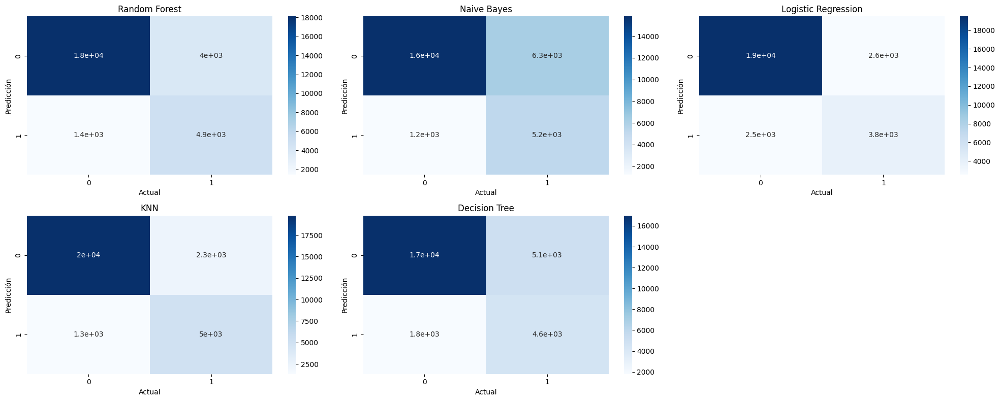

In [ ]:
trainer_class.print_corr_mat()

### ⬆ INTERPRETACIÓN

* El mejor modelo respecto a las matrices de confusión es "Random Forest" ya que presenta una buena tasa de TN, TP y FN respecto al conjunto de datos

* El modelo más débil testeado es Naive Bayes debido a su alta tasa de FN y con dificultades para la predicción de los datos y/o clases

### 🌊 VISUALIZAMOS CURVAS ROC DE LOS MODELOS ENTRENADOS

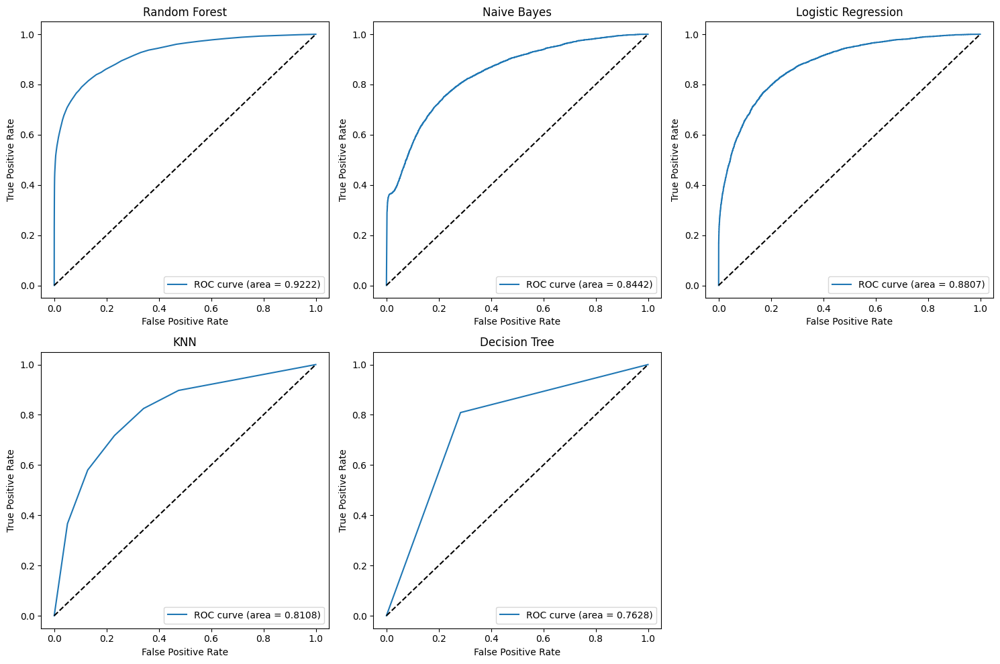

In [ ]:
trainer_class.print_roc_values()

### 🧾 RESULTADO MÉTRICAS DE LOS MODELOS ENTRENADOS

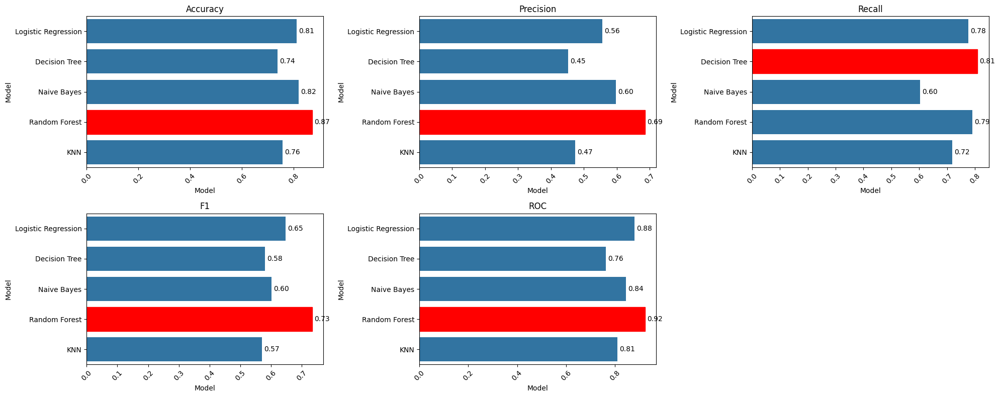

In [ ]:
trainer_class.plot_metrics()

### ⬆ INTERPRETACIÓN

🤔 De los resultados anteriores se desprende las siguientes conclusiones:

* El modelo que muestra mejor rendimiento es Random Forest, pues presenta altos puntajes en accuracy, precision, F1 y ROC AUC. Esto quiere decir que es un modelo bien balanceado y apto para uso general. Es un buen modelo cuando se busca una alta precision (evita falsos positivos).

* El modelo con mayor puntaje en recall es Decision Tree, es el que capta la mayor cantidad de valores positivos (RainTomorrow == "Yes"). Sin embargo, el que tiene menor precision, lo que puede implicar que entregue una mayor cantidad de falsos positivos.

* Regresion logistica mostró ser un modelo bastante balanceado al tener unos valores de precision y recall bastante decentes.

* Los modelos que presentaron un rendimiento pobre fueron KNN y Naive Bayes, por lo que no se pueden considerar para predecir las etiquetas de la variable objetivo.

🌳 Se conluye que el mejor modelo de clasificación para pasar a produccion es Random Forest

## 🎱 MODELO NO SUPERVISADO K-MEANS

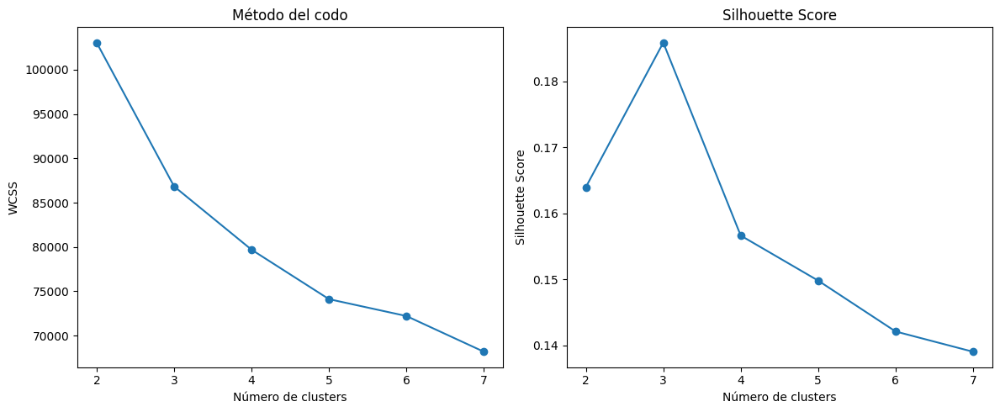

In [ ]:
 # Elegimos número de clusters con el metodo del codo

X_eval_sample, _ = train_test_split(X_train_scaled, train_size=0.1, random_state=42)

wcss = []
silhouette_scores = []
K = range(2,8)

for c in K:
  # kmeans = KMeans(n_clusters = c, random_state = 42)
  kmeans = MiniBatchKMeans(n_clusters = c, random_state = 42, batch_size = 256, n_init = 'auto')
  cluster_labels = kmeans.fit_predict(X_train_scaled)

  # WCSS se obtiene del modelo entrenado
  wcss.append(kmeans.inertia_)

  # Silhouette Score se calcula en la muestra
  cluster_labels_sample = kmeans.predict(X_eval_sample)
  silhouette_avg = silhouette_score(X_eval_sample, cluster_labels_sample)
  silhouette_scores.append(silhouette_avg)


# Gráfico del codo
plt.figure(figsize = (12,5))
plt.subplot(1,2,1)
plt.plot(K, wcss, marker = "o")
plt.title("Método del codo")
plt.xlabel("Número de clusters")
plt.ylabel("WCSS")

# Gráfico del Silhouette Score
plt.subplot(1,2,2)
plt.plot(K, silhouette_scores, marker = "o")
plt.title("Silhouette Score")
plt.xlabel("Número de clusters")
plt.ylabel("Silhouette Score")

# Ajustamos gráfico
plt.tight_layout()
plt.show()

### ⭐ MEJOR NÚMERO DE CLÚSTERES

In [ ]:
# Determinar el mejor K según Silhouette

best_k = K[silhouette_scores.index(max(silhouette_scores))]
print(f" 😎 Mejor número de clusters según Silhouette: {best_k}")

 😎 Mejor número de clusters según Silhouette: 3


### 😱 FINAL TRAINING K-MEANS

In [ ]:
# Entrenamiento final de K-Means y adición de clústeres como característica

kmeans = MiniBatchKMeans(n_clusters = best_k, random_state = 42, batch_size = 256, n_init = 'auto')
# clusters = kmeans.fit_predict(X_train_scaled)

clusters_train = kmeans.fit_predict(X_train_scaled)
clusters_test = kmeans.predict(X_train_scaled)


# Añadir la columna de clúster a los datos procesados
X_train_with_clusters = np.hstack((X_train_scaled, clusters_train.reshape(-1, 1)))
X_test_with_clusters = np.hstack((X_train_scaled, clusters_test.reshape(-1, 1)))

# Dimensions
print(f"X_train_with_clusters shape: {X_train_with_clusters.shape}")
print(f"X_test_with_clusters shape: {X_test_with_clusters.shape}")

X_train_with_clusters shape: (113754, 24)
X_test_with_clusters shape: (113754, 24)


### 👀 VISUALIZAMOS CLÚSTERES UTILIZANDO PCA

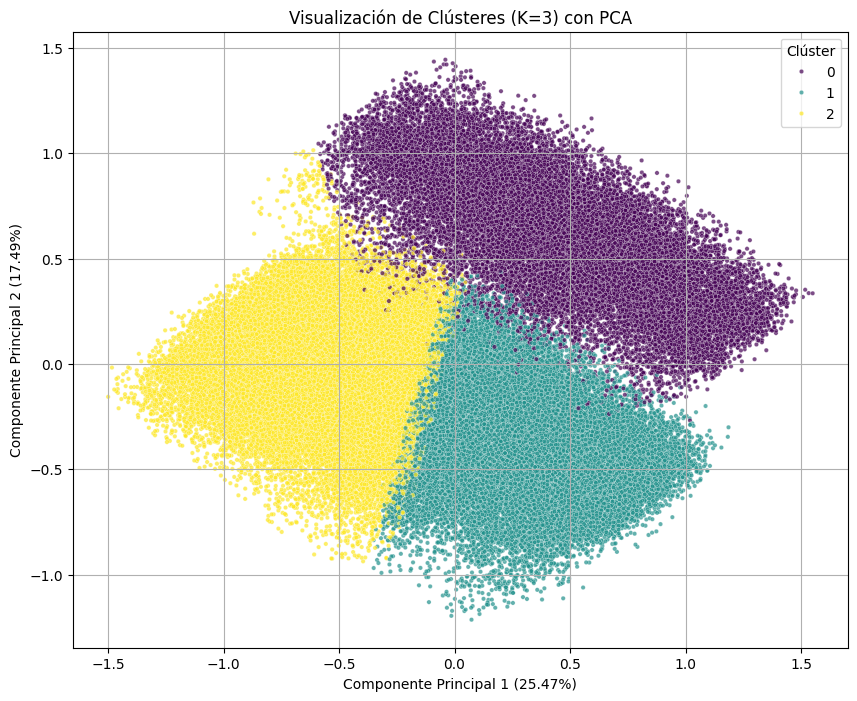

In [ ]:
# Visualización de clústeres con PCA

pca = PCA(n_components=2, random_state=42)
X_pca = pca.fit_transform(X_train_scaled)

df_pca = pd.DataFrame(data=X_pca, columns=['PC1', 'PC2'])
df_pca['Cluster'] = clusters_train

plt.figure(figsize=(10, 8))
sns.scatterplot(x='PC1', y='PC2', hue='Cluster', data=df_pca, palette='viridis', s=10, alpha=0.7)
plt.title(f'Visualización de Clústeres (K={best_k}) con PCA')
plt.xlabel(f'Componente Principal 1 ({pca.explained_variance_ratio_[0]*100:.2f}%)')
plt.ylabel(f'Componente Principal 2 ({pca.explained_variance_ratio_[1]*100:.2f}%)')
plt.legend(title='Clúster')
plt.grid(True)
plt.show()

### 📊 RESUMEN ESTADÍSTICO DE CARACTERÍSTICAS PARA CADA CLÚSTER

In [ ]:
# Calcular las estadísticas descriptivas de las características originales para cada clúster.

X_train['Cluster'] = clusters_train
cluster_means = X_train.groupby('Cluster')[numeric_cols].mean()
print("\nMedias de características numéricas por Clúster:")
print("\n", cluster_means)


Medias de características numéricas por Clúster:

          Cloud3pm  Cloud9am  Evaporation  Humidity3pm  Humidity9am    MaxTemp  \
Cluster                                                                         
0        5.711050  5.854124     4.160575    63.416116    81.021071  20.132297   
1        5.352312  5.179892     4.098017    51.586869    71.422852  20.414810   
2        3.985818  4.014607     6.190440    42.973054    60.761451  27.104464   

           MinTemp  Pressure3pm  Pressure9am   RISK_MM  Rainfall  Sunshine  \
Cluster                                                                      
0        12.787574  1014.449502  1015.975509  0.850434  1.300860  7.100740   
1         9.126756  1016.215139  1018.840087  0.301429  0.081316  7.699153   
2        14.673565  1015.068168  1017.784726  0.113846  0.039074  9.376732   

           Temp3pm    Temp9am  WindGustSpeed  WindSpeed3pm  WindSpeed9am  
Cluster                                                                   
0

### ⬆ INTERPRETACIÓN

**🟣 Clúster 0: "Días Cálidos, Muy Lluviosos con Alta Humedad y Baja Presión"**

* MinTemp (12.78): Temperatura mínima más alta entre los tres.

* MaxTemp (20.13): Temperatura máxima intermedia, pero sigue siendo cálida.

* Rainfall (1.30): La mayor cantidad de precipitación de los tres clústeres,    indicando días con lluvia significativa.

* Evaporation (4.16): Evaporación media, no tan alta como en días secos ni tan baja como en días muy fríos.

* Sunshine (7.10): Cantidad de horas de sol intermedia, sugiriendo cielos parcialmente nublados.

* WindGustSpeed (42.08): Velocidad de ráfaga de viento moderada.

* Pressure9am (1015.97) & Pressure3pm (1014.44): Presiones atmosféricas intermedias a bajas, lo que puede indicar inestabilidad y potencial de lluvia.

* Humidity9am (81.02) & Humidity3pm (63.41): Humedades notablemente altas, lo que es coherente con un ambiente lluvioso.

* Cloud9am (5.85) & Cloud3pm (5.71): Cobertura de nubes intermedia a alta.


**🔵 Clúster 1: "Días templados a frescos, húmedos y lluviosos con vientos fuertes y baja presión"**

* MinTemp (9.13): Segunda temperatura mínima más baja.

* MaxTemp (20.41): Segunda temperatura máxima más baja.

* Rainfall (2.01): Precipitación moderadamente alta, cercana al clúster 0.

* Evaporation (4.09): Baja evaporación, coherente con condiciones húmedas.

* Sunshine (7.61): Horas de sol moderadas, inferiores al clúster 2.

* WindGustSpeed (38.09): Ráfagas de viento intermedias.

* Pressure9am (1010.84) & Pressure3pm (1016.22): Presión relativamente alta (segunda más alta).

* Humidity9am (71.42) & Humidity3pm (51.58): Humedades elevadas, pero no las más altas.

* Cloud9am (5.17) & Cloud3pm (5.35): Cobertura nubosa media-alta.


**🟡 Clúster 2: "Días cálidos, secos, soleados y estables con alta presión"**

* MinTemp (14.67): La temperatura mínima más alta.

* MaxTemp (27.10): La temperatura máxima más alta.

* Rainfall (0.38): La menor precipitación significativa.

* Evaporation (6.19): La mayor evaporación, propia de climas cálidos y secos.

* Sunshine (9.38): La mayor cantidad de horas de sol.

* WindGustSpeed (38.41): Ráfagas de viento similares a las del clúster 1, moderadas.

* Pressure9am (1017.78) & Pressure3pm (1015.09): Las presiones más altas, condiciones muy estables.

* Humidity9am (60.76) & Humidity3pm (42.97): Humedad moderada, pero la más baja entre los tres clústeres.

* Cloud9am (4.01) & Cloud3pm (3.98): Menor cobertura nubosa.

### 💡 CONCLUSIONES CLÚSTERES

* **🟣 Conclusión del Clúster 0:** Este clúster representa días cálidos, muy húmedos, con nubes y una cantidad considerable de lluvia. Podrían describir tormentas de verano, días de lluvia estacional o periodos de alta humedad.

* **🔵 Conclusión Clúster 1:** Agrupa días húmedos, con temperaturas frescas, presencia de lluvias y nubosidad, aunque no tan extremos como el clúster 0. Representa condiciones inestables, pero no severas.

* **🟡 Conclusión Clúster 2:** Días calurosos, secos y soleados con condiciones muy estables. Es el clúster de "buen tiempo", ideal para actividades al aire libre.

In [ ]:
# También se podría analizar las categóricas

for cat_col in cat_encoded_cols:
  print(f"\nDistribución de {cat_col} por Clúster:")
  print(X_train.groupby('Cluster')[cat_col].value_counts(normalize=True))


Distribución de Location_encoded por Clúster:
Cluster  Location_encoded
0        0.359020            0.007524
         0.363527            0.006884
         0.354847            0.006844
         0.362363            0.006844
         0.318877            0.006483
                               ...   
2        0.233251            0.001068
         0.233875            0.001025
         0.233764            0.000937
         0.236196            0.000763
         0.241830            0.000763
Name: proportion, Length: 735, dtype: float64

Distribución de WindGustDir_encoded por Clúster:
Cluster  WindGustDir_encoded
0        0.266962               0.032177
         0.268688               0.030896
         0.272390               0.030096
         0.271676               0.029575
         0.269974               0.029175
                                  ...   
2        0.287354               0.001373
         0.278917               0.001308
         0.282411               0.001264
         0.2867

# V: Evaluation

### 🔝 Optimizando modelos de regresión con RandomizeSearchCV

In [ ]:
# Definir cuadrícula de hiperparámetros (param_grid)
param_grid_reg = {
    "Lineal Regression": {
        "fit_intercept": [True, False]
    },
    "SVM Regressor": {
        "C": [0.01, 0.1, 1, 10, 100],
        "epsilon": [0.1, 0.2, 0.5],
        "loss": ["epsilon_insensitive", "squared_epsilon_insensitive"]
    },
    "Decision Tree Regressor": {
        "max_depth": [None, 5, 10, 20],
        "min_samples_split": [2, 5, 10],
        "min_samples_leaf": [1, 2, 4],
        "criterion": ["squared_error", "friedman_mse"]
    }
}

In [ ]:
trainer_reg_cv_new = RegressionModelTrainer()
trainer_reg_cv_new.train_model(X_selected_reg, X_test_selected_reg, y_train_reg, y_test_reg,models_reg, param_grids = param_grid_reg, cv = 3)

In [ ]:
trainer_reg_cv_new.print_results()

,Model,MSE,R2,Best Params,Best Score
2,Decision Tree Regressor,1.282771,0.415254,"{'min_samples_split': 10, 'min_samples_leaf': 1, 'max_depth': 5, 'criterion': 'squared_error'}",0.417305
0,Lineal Regression,1.635862,0.254298,{'fit_intercept': True},0.239304
1,SVM Regressor,1.646282,0.249549,"{'loss': 'squared_epsilon_insensitive', 'epsilon': 0.2, 'C': 10}",0.233884


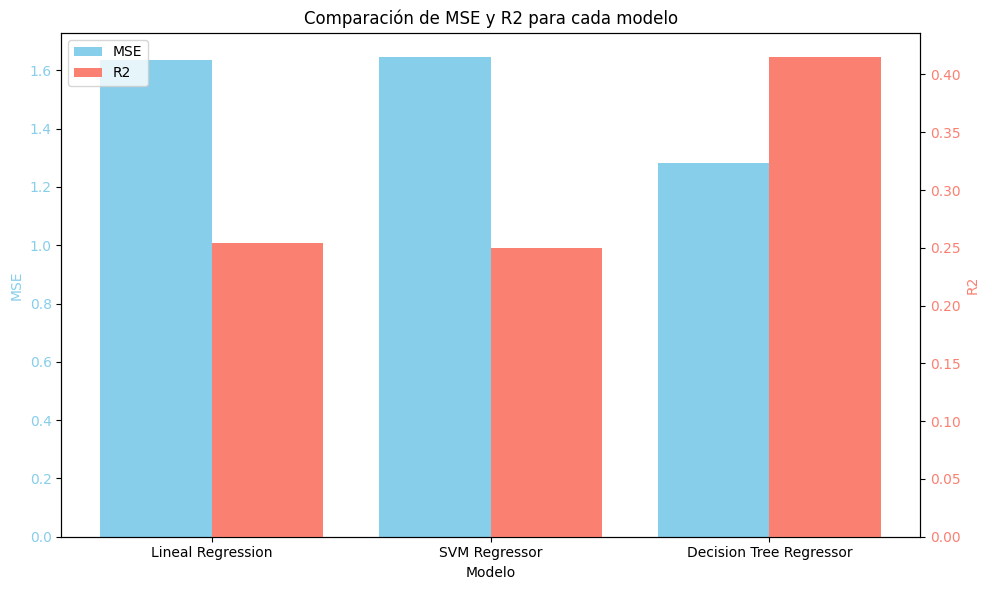

In [ ]:
trainer_reg_cv_new.plot_results()

#### ⬆ INTERPRETACIÓN

Una vez realizado el proceso de cross validation, se obtiene los sieguientes resultados:

* Decision Tree Regressor: Es el que presenta mejor rendimiento de los tres modelos de regresión. Consta de un aumento substancial en su R2 respecto al modelo anterior (captura 41.5% de la varianza de los datos) y respecto a los demás modelos. Además, tiene un CV score (Best Score) que se condice con su valor de R2, lo que implica una buena generalización si se considera la evaluación anterior del modelo. Es un buen candidato para pasar a producción.

* Linear Regression: Practicamente nula mejora en su rendimiento (R2 0.2543). Logra campturar algo de la varianza de los datos, pero muy limitadamente.

* SVM Regressor: Similar a la regresión lineal, pero ligeramente peor (R2 0.2459 y MSE 1.646). A pesar de la modificación de parametros, no muestra mejoras significativas. No es la mejor opción para esta data si no se modifica fuertemente o se cambia el kernel, lo que aumenta significativamente el tiempo de evaluación.

Finalmente, se reitera las mejoras futuras mencionadas en el apartado de modelamiento de modelos de regresión.

### 🔝 Optimizando modelos de clasificación con RandomizeSearchCV

In [ ]:
params_grid = {
    'Logistic Regression': {
        'C': [0.01, 0.1, 1, 10],
        'penalty': ['l2'],  # 'l1' requires solver='liblinear'
        'solver': ['lbfgs', 'liblinear']
    },
    'Decision Tree': {
        'max_depth': [None, 5, 10, 20],
        'min_samples_split': [2, 5, 10],
        'criterion': ['gini', 'entropy']
    },
    'Naive Bayes': {
        'var_smoothing': [1e-9, 1e-8, 1e-7]
    },
    'Random Forest': {
        'n_estimators': [50, 100, 200],
        'max_depth': [None, 10, 20],
        'min_samples_split': [2, 5],
        'criterion': ['gini', 'entropy']
    },
    'KNN': {
        'n_neighbors': [3, 5, 7, 9],
        'weights': ['uniform', 'distance'],
        'metric': ['euclidean', 'manhattan']
    }
}

In [ ]:
trainer_class_cv = ClassificationModelTrainer()

trainer_class_cv.trainer(
    X_selected_classif, y_resampled_classif, X_test_selected_classif, y_test,
    models_classif, sample_train = True ,cv = 3,param_grids = params_grid)

In [ ]:
trainer_class_cv.print_results()

,Model,Best Params,Best Score,Accuracy,Precision,Recall,F1,ROC
3,Random Forest,"{'n_estimators': 200, 'min_samples_split': 2, 'max_depth': None, 'criterion': 'entropy'}",0.962707,0.858328,0.648820,0.802196,0.717402,0.921567
1,Decision Tree,"{'min_samples_split': 10, 'max_depth': 10, 'criterion': 'entropy'}",0.904512,0.832062,0.601344,0.744157,0.665171,0.880186
2,Naive Bayes,{'var_smoothing': 1e-07},0.849469,0.819297,0.595223,0.605961,0.600544,0.843534
0,Logistic Regression,"{'solver': 'lbfgs', 'penalty': 'l2', 'C': 10}",0.885930,0.812265,0.558810,0.772078,0.648357,0.880368
4,KNN,"{'weights': 'distance', 'n_neighbors': 5, 'metric': 'manhattan'}",0.898592,0.771687,0.493795,0.736471,0.591198,0.828930


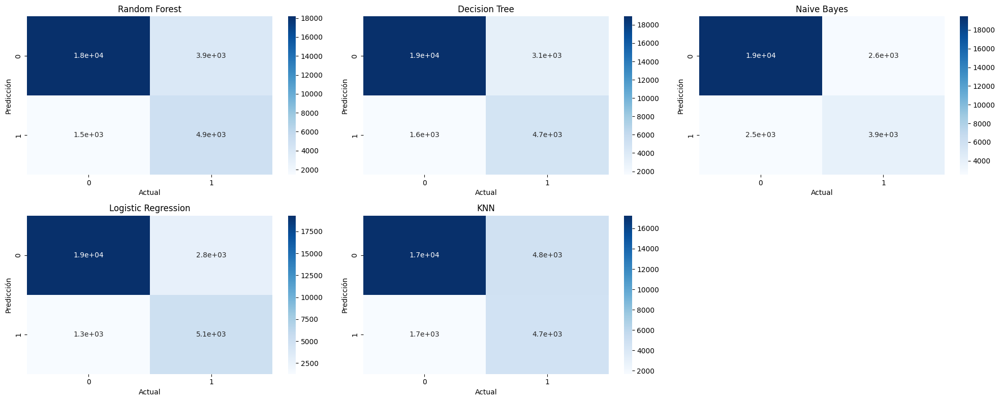

In [ ]:
trainer_class_cv.print_corr_mat()

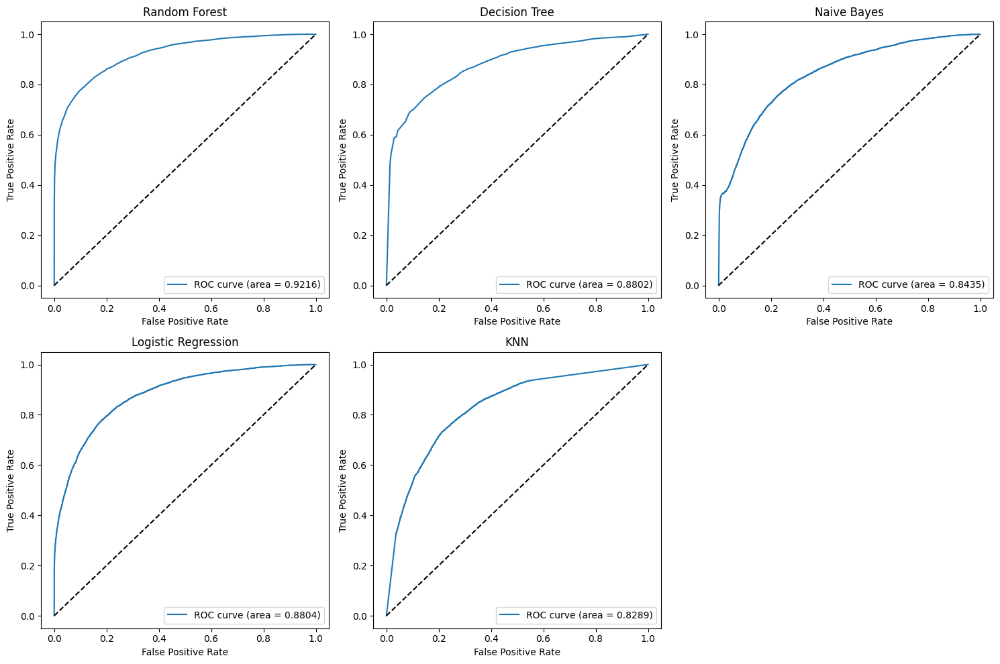

In [ ]:
trainer_class_cv.print_roc_values()

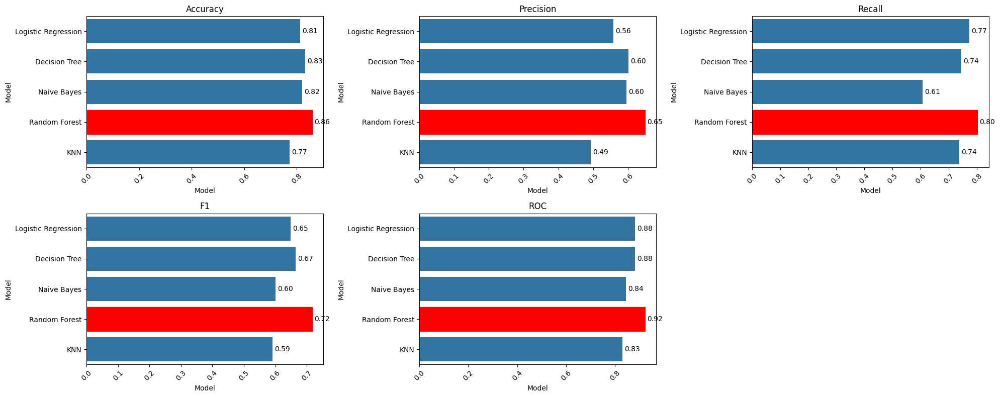

In [ ]:
trainer_class_cv.plot_metrics()

#### ⬆ INTERPRETACIÓN

Una ves realizada la evaluación con los mejores hiperparámetros, se puede extraer las siguientes conclusiones:

* El modelo con mejor rendimiento sigue siendo Random Forest. Este modelo presenta métricas sólidas y presenta un buen rendimiento post selección de hiperparámetros. Incluso, existen leves mejoras en las métricas de recall y ROC AUC.

* La regresión logística presenta un rendimiento razonable. La optimización de hiperparámetros ayudó a mejorar las métricas de F1 y ROC AUC. Si interpretabilidad es el objetivo de este entrenamieto, la regresión logística es un buen modelo para entrenar.

* KNN es el modelo que presentó mayores mejoras, reflejado en su Best Score. Si bien sigue estando detras de Random Forest y Regresión Logística, presenta un recall sólido. Sin embargo, tiene una precisión realtivamente débil.


En resumen, si lo que se busca es pasar a producción un modelo de clasificación, el mejor es Random Forest, dada su robustez. Si lo que se busca es interpretabilidad, transparencia y rapidez, se recomeinda usar Regresión Logística